# REINFORCEMENT LEARNING


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import pandas as pd

import gym

from IPython import display as ipythondisplay
import imageio
from collections import deque
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

import os
import time

# Reinforcement Learning:

### Reinforcement learning (RL) is a machine learning (ML) technique that trains software to make decisions to achieve the most optimal results. It mimics the trial-and-error learning process that humans use to achieve their goals. Software actions that work towards your goal are reinforced, while actions that detract from the goal are ignored. 
#### (https://aws.amazon.com/what-is/reinforcement-learning/#:~:text=Reinforcement%20learning%20(RL)%20is%20a,use%20to%20achieve%20their%20goals)

### 
RL algorithms use a reward-and-punishment paradigm as they process data. They learn from the feedback of each action and self-discover the best processing paths to achieve final outcomes. The algorithms are also capable of delayed gratification. The best overall strategy may require short-term sacrifices, so the best approach they discover may include some punishments or backtracking along the way. RL is a powerful method to help artificial intelligence (AI) systems achieve optimal outcomes in unseen environment

#### Key algorithms in RL include Q-learning, Deep Q-Networks (DQN), and policy gradient methodss.

# Deep Reinforcement Learning:

#### Deep Reinforcement Learning combines reinforcement learning (RL) with deep learning techniques to enable agents to learn complex behaviors from high-dimensional sensory inputs, such as images. In Deep Reinforcement Learning, deep neural networks are used to approximate value functions, policies, or models of the environment. This allows the agent to make decisions based on large and unstructured data inputs, like raw pixels in video games.

#### A common architecture in Deep Reinforcement Learning is the Deep Q-Network (DQN), which approximates the Q-value function using a neural network. Another approach involves policy-based methods, such as Deep Deterministic Policy Gradient (DDPG) and Actor-Critic models, where neural networks learn policies directly.

#### Deep RL has been successfully applied to various domains, including playing video games at a superhuman level, robotics, autonomous driving, and natural language processing tasks. It leverages the representational power of deep learning to handle complex, high-dimensional environments that traditional RL methods struggle with.

# Background Research: 

### What is gym?
#### The Gym environment, developed by OpenAI, is a toolkit for developing and comparing reinforcement learning (RL) algorithms. It provides a wide range of standardized environments (such as games, simulations, and control tasks) that allow users to test and train RL agents. Each environment follows a consistent interface with methods like reset(), step(action), and render(), making it easy to implement and evaluate RL algorithms. The toolkit includes various types of environments. Gym environments provide a framework for agents to interact with an environment, learn policies, and improve performance through exploration and exploitation.

### The Pendulum-v1 environment in gym:
#### The inverted pendulum swingup problem is based on the classic problem in control theory. The system consists of a pendulum attached at one end to a fixed point, and the other end being free. The pendulum starts in a random position and the goal is to apply torque on the free end to swing it into an upright position, with its center of gravity right above the fixed point. (https://www.gymlibrary.dev/environments/classic_control/pendulum/)ed).

### How are the rewards defined?
#### The reward function is defined as: r = -(theta^2 + 0.1 * theta_dt^2 + 0.001 * torque^2) where theta is the pendulum’s angle normalized between [-pi, pi] (with 0 being in the upright position). Based on the above equation, the minimum reward that can be obtained is -(pi^2 + 0.1 * 8^2 + 0.001 * 22) = -16.2736044, while the maximum reward is zero (pendulum is upright with zero velocity and no torque applied).

### Where does the pendulum start from?
#### The starting state is a random angle in [-pi,pi] and a random angular velocity in [-1,1]

### How long does a trial take?
#### The episode truncates at 200 time steps

In [3]:
# number of actions and observations
num_actions = env.action_space.shape[0]
num_states = env.observation_space.shape[0]
# action bounds
upper_bound = env.action_space.high[0]
lower_bound = env.action_space.low[0]

print(f"State space: {env.observation_space}")
print(f"Action space: {env.action_space}")
print(f"\nNumber of states: {num_states}")
print(f"Number of actions: {num_actions}")
print(f"\nLower bound of action space: {lower_bound}")
print(f"Upper bound of action space: {upper_bound}")

State space: Box([-1. -1. -8.], [1. 1. 8.], (3,), float32)
Action space: Box(-2.0, 2.0, (1,), float32)

Number of states: 3
Number of actions: 1

Lower bound of action space: -2.0
Upper bound of action space: 2.0


# Model Building

### What is an Agent?

#### An agent in reinforcement learning is an entity that interacts with an environment to achieve a specific goal. It observes the state of the environment, makes decisions or takes actions based on its observations, and receives feedback in the form of rewards or penalties. The agent's objective is to learn a strategy or policy that maximizes the cumulative reward it receives over time. In essence, an agent learns from its interactions to improve its performance and decision-making in a given task.

## DQN

### Deep Q-Networks (DQN):
#### https://medium.com/@shruti.dhumne/deep-q-network-dqn-90e1a8799871

#### Deep Q-Network (DQN) is an algorithm that merges deep learning with the Q-learning method to optimize action-value functions in reinforcement learning tasks. It involves representing the current state of an environment numerically, often using raw pixel values or preprocessed features. This representation is then fed into a deep neural network, typically a convolutional neural network (CNN), which outputs Q-values for each possible action the agent can take.

### There are 3 parts to a DQN:
### 1. Replay Buffer (Memory)
### 2. Q Network (Player)
####    - This player makes moves based on their understanding of the game, constantly trying out new strategies and refining their skills. Their                 strategies can change rapidly as they learn from successes and mistakes during the game.

### 3. Target Network (Coach)
####    - This coach, on the other hand, is a trusted advisor who provides stable guidance. The coach updates their advice based on the experienced               player's strategies, but does so infrequently, ensuring that their guidance remains steady and reliable over time.

#### To enhance learning stability, DQN uses a technique called experience replay, where the agent's experiences—comprising state, action, reward, and next state tuples—are stored in a replay memory buffer. The algorithm periodically samples random mini-batches from this buffer to update the neural network's weights. This random sampling helps to decorrelate the data and break temporal dependencies between sequential experiences, thus stabilizing the learning process.

#### The update of the network is guided by a loss function derived from the Bellman equation, which aims to minimize the discrepancy between the predicted Q-values and the target Q-values. The targets are calculated using a separate, slowly updated target network. This target network has the same architecture as the main network but is updated less frequently to further stabilize the learning process.

#### DQN also employs an exploration-exploitation strategy to balance between exploring new actions and exploiting the best-known actions. Typically, this is implemented using an epsilon-greedy approach, where the agent occasionally chooses random actions to explore the environment.

#### How will we evaluate the DQN?
#### 1. Visually looking at the evaluated GIF
#### 2. Moving average curve along with the reward list

In [2]:
# Replay Buffer Class
class ReplayBuffer:
    def __init__(self, max_size):
        """
        Initialize the ReplayBuffer.

        Args:
            max_size (int): The maximum number of transitions the buffer can hold.
        """
        # Initialize a deque with a maximum size to store transitions
        self.buffer = deque(maxlen=max_size)

    def add(self, transition):
        """
        Add a transition to the buffer.

        Args:
            transition: The transition to be added, typically a tuple (state, action, reward, next_state).
        """
        # Append the transition to the buffer
        self.buffer.append(transition)

    def sample(self, batch_size):
        """
        Sample a batch of transitions from the buffer.

        Args:
            batch_size (int): The number of transitions to sample.

        Returns:
            List: A list of sampled transitions.
        """
        # Randomly select indices to sample transitions
        indices = np.random.choice(len(self.buffer), batch_size, replace=False)
        # Retrieve and return the sampled transitions
        return [self.buffer[idx] for idx in indices]

    def size(self):
        """
        Get the current size of the buffer.

        Returns:
            int: The number of transitions currently in the buffer.
        """
        # Return the number of transitions in the buffer
        return len(self.buffer)


In [3]:
# QNetwork Class
class QNetwork:
    def __init__(self, state_dim, action_dim, learning_rate, layer_1, layer_2):
        """
        Initialize the QNetwork.

        Args:
            state_dim (int): The dimensionality of the state space.
            action_dim (int): The number of possible actions.
            learning_rate (float): The learning rate for the optimizer.
            layer_1 (int): The number of units in the first hidden layer.
            layer_2 (int): The number of units in the second hidden layer.
        """
        # Build the model with the specified dimensions and layers
        self.model = self.build_model(state_dim, action_dim, layer_1, layer_2)
        # Initialize the Adam optimizer with the given learning rate
        self.optimizer = Adam(learning_rate=learning_rate)
    
    def build_model(self, state_dim, action_dim, layer_1, layer_2):
        """
        Construct the Q-network model.

        Args:
            state_dim (int): The dimensionality of the input state.
            action_dim (int): The number of output actions.
            layer_1 (int): Number of units in the first dense layer.
            layer_2 (int): Number of units in the second dense layer.

        Returns:
            Model: The compiled Keras model.
        """
        # Define the input layer with the given state dimension
        inputs = layers.Input(shape=(state_dim,), name='Input')
        # Add a dense layer with ReLU activation
        x = layers.Dense(layer_1, activation='relu')(inputs)
        # Add a second dense layer with ReLU activation
        x = layers.Dense(layer_2, activation='relu')(x)
        # Add the output layer with a linear activation for Q-values
        outputs = layers.Dense(action_dim, activation='linear', name='Output')(x)
        # Create and return the model
        model = Model(inputs, outputs)
        return model

    @tf.function
    def predict(self, state):
        """
        Predict Q-values for a given state.

        Args:
            state: The state for which Q-values are to be predicted.

        Returns:
            Tensor: The predicted Q-values.
        """
        # Perform inference (prediction) with the model, without training updates
        return self.model(state, training=False)

    @tf.function
    def train_on_network(self, states, targets):
        """
        Train the network on a batch of states and target Q-values.

        Args:
            states: The batch of input states.
            targets: The target Q-values for the corresponding states.
        """
        with tf.GradientTape() as tape:
            # Forward pass: get predictions for the given states
            predictions = self.model(states, training=True)
            # Compute the loss as mean squared error between targets and predictions
            loss = tf.reduce_mean(tf.square(targets - predictions))
        # Compute gradients with respect to the loss
        gradients = tape.gradient(loss, self.model.trainable_variables)
        # Update model weights using the optimizer
        self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
    
    def set_weights(self, other_model):
        """
        Copy weights from another model to this QNetwork.

        Args:
            other_model: The model from which to copy weights.
        """
        # Set the weights of this model to those of the given model
        self.model.set_weights(other_model.get_weights())


In [4]:
# DQNAgent Class
class DQNAgent:
    def __init__(self, state_dim=3, action_dim=9, learning_rate=0.002, gamma=0.98, batch_size=32, target_update_freq=10, epsilon=1.0, epsilon_min=0.1, epsilon_decay=0.99, layer_1=64, layer_2=64, memory_size=10000):
        """
        Initialize the DQN Agent.

        Args:
            state_dim (int): The dimensionality of the state space.
            action_dim (int): The number of possible actions.
            learning_rate (float): The learning rate for the optimizer.
            gamma (float): The discount factor for future rewards.
            batch_size (int): The size of the batch for training.
            target_update_freq (int): How often to update the target network.
            epsilon (float): Initial exploration rate.
            epsilon_min (float): Minimum exploration rate.
            epsilon_decay (float): Decay factor for exploration rate.
            layer_1 (int): Number of units in the first hidden layer of the Q-network.
            layer_2 (int): Number of units in the second hidden layer of the Q-network.
            memory_size (int): Maximum size of the replay buffer.
        """
        self.state_dim = state_dim
        self.action_dim = action_dim
        self.learning_rate = learning_rate
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.batch_size = batch_size
        self.target_update_freq = target_update_freq
        self.training_counter = 0

        # Define the discrete action space range
        self.discrete_actions = np.linspace(-2.0, 2.0, num=action_dim)
        # Initialize replay buffer
        self.memory = ReplayBuffer(memory_size)
        
        # Initialize Q-network and target Q-network
        self.Q = QNetwork(state_dim, action_dim, learning_rate, layer_1, layer_2)
        self.Q_target = QNetwork(state_dim, action_dim, learning_rate, layer_1, layer_2)
        self.update_target_network()

    def choose_action(self, state, evaluate):
        """
        Choose an action based on the current state.

        Args:
            state: The current state.
            evaluate (bool): If True, use the greedy policy; otherwise, use epsilon-greedy policy.

        Returns:
            int: The selected action.
        """
        # Epsilon-greedy policy for exploration and exploitation
        if np.random.rand() <= self.epsilon and not evaluate:
            return np.random.randint(0, len(self.discrete_actions))

        # Process state and predict Q-values
        state = self.process_state(state)
        q_values = self.Q.predict(tf.convert_to_tensor(state.reshape(1, -1), dtype=tf.float32))
        return np.argmax(q_values.numpy())

    def update_epsilon(self):
        """
        Update the exploration rate epsilon.
        """
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def store_transition(self, state, action, reward, next_state, done):
        """
        Store a transition in the replay buffer.

        Args:
            state: The current state.
            action: The action taken.
            reward: The reward received.
            next_state: The next state.
            done (bool): Whether the episode has ended.
        """
        self.memory.add((state, action, reward, next_state, done))
        
    def train(self):
        """
        Train the Q-network using a batch of transitions from the replay buffer.
        """
        self.training_counter += 1
        
        if self.memory.size() < self.batch_size:
            return
        
        # Sample a batch of transitions
        batch = self.memory.sample(self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)
        
        # Process states and next_states
        states = np.vstack([self.process_state(s) for s in states])
        next_states = np.vstack([self.process_state(s) for s in next_states])
        
        actions = np.array(actions)
        rewards = np.array(rewards)
        dones = np.array(dones)
        
        # Compute target Q-values
        target_q_values = self.Q_target.predict(tf.convert_to_tensor(next_states, dtype=tf.float32)).numpy()
        targets = rewards + self.gamma * np.max(target_q_values, axis=1) * (1 - dones)
        
        # Update Q-values
        q_values = self.Q.predict(tf.convert_to_tensor(states, dtype=tf.float32)).numpy()
        q_values[np.arange(self.batch_size), actions] = targets

        # Train the Q-network
        self.Q.train_on_network(tf.convert_to_tensor(states, dtype=tf.float32), tf.convert_to_tensor(q_values, dtype=tf.float32))
    
        # Update target network if necessary
        if self.training_counter >= self.target_update_freq:
            self.update_target_network()
            self.training_counter = 0
    
    def update_target_network(self):
        """
        Update the target network to match the Q-network.
        """
        self.Q_target.set_weights(self.Q.model)

    def process_state(self, state):
        """
        Process and validate the state.

        Args:
            state: The state to process.

        Returns:
            np.ndarray: The processed state.
        """
        if isinstance(state, tuple):
            state = state[0]
        if isinstance(state, np.ndarray) and state.shape != (3,):
            raise ValueError("State shape is not consistent")
        return state

    def save_model(self, Q_filename, t_filename):
        """
        Save the models' weights to files.

        Args:
            Q_filename (str): File path for saving the Q-network weights.
            t_filename (str): File path for saving the target Q-network weights.
        """
        self.Q.model.save_weights(Q_filename)
        self.Q_target.model.save_weights(t_filename)

    def load_model(self, Q_filename, t_filename):
        """
        Load the models' weights from files.

        Args:
            Q_filename (str): File path for loading the Q-network weights.
            t_filename (str): File path for loading the target Q-network weights.
        """
        self.Q.model.load_weights(Q_filename)
        self.Q_target.model.load_weights(t_filename)


#### The train_agent function has a success threshold which will be used only during the final training to determine when to stop training

#### The criteria to be met for training to stop: Within a range of 50 episodes, at least 85% of the episodes must reach a reward of >-275

In [28]:
# Function to train the DQN Model
def train_agent(episodes=200, save_gif=True, gif_path='dqn_pendulum.gif', agent=DQNAgent(), tuning=False, evaluate_base=False):
    env = gym.make('Pendulum-v1', render_mode='rgb_array')
    env.action_space.seed(42)
    agent = agent
    reward_list = []
    reward_variance = 0
    reward_mean = 0
    count = 0
    success_rate = 0
    successful_episodes = 0
    stop = False
    reward_history = deque(maxlen=20)  # Deque to store the last 20 rewards

    if not tuning:
        episodes = 100000
        success_threshold = -275.0
        
    while not stop: 
        for episode in range(episodes):
            count += 1
            state, _ = env.reset()
            done = False
            total_reward = 0
            frames=[]
            
            while not done:
                action_index = agent.choose_action(state, evaluate=False)
                action = agent.discrete_actions[action_index]
                next_state, reward, terminated, truncated, _ = env.step([action])
                done = terminated or truncated
                agent.store_transition(state, action_index, reward, next_state, done)
                agent.train()
                agent.update_epsilon()
                state = next_state
                total_reward += reward
                if (success_rate > 80.0 or episode == episodes - 1) and save_gif:
                    frames.append(env.render())
                    
            reward_list.append(total_reward)
            reward_history.append(total_reward)
                
                
            if (episode+1) % 5 == 0:
                print(f'Episode: {episode+1}, Total Reward: {total_reward}')
    
            # Check if the episode is successful
            if not tuning:
                if total_reward >= success_threshold:
                    successful_episodes += 1
                success_rate = round((successful_episodes/50)*100,1)
                if success_rate > 85.0:
                    print(f'\nSuccess rate of {success_rate}% reached. Stopping training.')
                    agent.save_model("final_DQN_Q_model.h5", "final_DQN_Target_model.h5")
                    stop=True

                    # Show final output of DQN training
                    if save_gif:
                        imageio.mimsave(gif_path, frames, fps=50, loop=0)
                        print(f'Saved GIF to {gif_path}')

                    break
                        
                if (episode+1) % 50 == 0:
                    print(f'Success rate of {success_rate}%')
                    successful_episodes = 0
                    success_rate = 0
        
        if save_gif and tuning:
            imageio.mimsave(gif_path, frames, fps=50, loop=0)
            print(f'Saved GIF to {gif_path}')
    
        # Calculate mean and standard deviation of the last 10 rewards
        if len(reward_history) == 20:
            reward_std_dev = np.std(reward_history)
            reward_mean = np.mean(reward_history)
            print(f'\nLast 20 Rewards Standard Deviation: {reward_std_dev:.1f}, Mean: {reward_mean:.1f}')
            
        if evaluate_base:
            agent.save_model("base_DQN_Q_model.h5", "base_DQN_Target_model.h5")
            
        stop=True
        
    env.close()
    return reward_list



In [6]:
# Function to evaluate the final DQN
def test_agent(episodes=10, save_gif=True, gif_path='dqn_pendulum_final.gif', agent=DQNAgent()):
    env = gym.make('Pendulum-v1', render_mode='rgb_array')
    env.action_space.seed(42)
    total_rewards = []
    for _ in range(episodes):
        frames=[]
        state = env.reset()
        done = False
        episode_reward = 0
        while not done:
            action_index = agent.choose_action(state, evaluate=True)
            action = agent.discrete_actions[action_index]
            next_state, reward, terminated, truncated, _ = env.step([action])
            done = terminated or truncated
            state = next_state
            episode_reward += reward
            frames.append(env.render())
        total_rewards.append(episode_reward)
        
    imageio.mimsave(gif_path, frames, fps=50, loop=0)
    print(f'Saved GIF to {gif_path}')
    return np.mean(total_rewards), np.std(total_rewards)
                    
      


## Base DQN

In [23]:
base_dqn_agent = DQNAgent()
reward_list_base = train_agent(agent=base_dqn_agent, gif_path='base_dqn_pendulum.gif', evaluate_base=True, tuning=True)

Episode: 5, Total Reward: -804.2203251030544
Episode: 10, Total Reward: -1064.8509484486174
Episode: 15, Total Reward: -1168.664581289498
Episode: 20, Total Reward: -1260.7599050066094
Episode: 25, Total Reward: -384.12328912571775
Episode: 30, Total Reward: -260.3862367885987
Episode: 35, Total Reward: -124.18098525320582
Episode: 40, Total Reward: -129.3769877062817
Episode: 45, Total Reward: -118.23506982088885
Episode: 50, Total Reward: -2.166580539949014
Episode: 55, Total Reward: -117.18984800041787
Episode: 60, Total Reward: -128.74379243395904
Episode: 65, Total Reward: -126.31714918768053
Episode: 70, Total Reward: -696.667792397174
Episode: 75, Total Reward: -121.93496578463707
Episode: 80, Total Reward: -450.6069388867451
Episode: 85, Total Reward: -247.55118447951872
Episode: 90, Total Reward: -356.2714093557849
Episode: 95, Total Reward: -121.8672818277363
Episode: 100, Total Reward: -122.10533550904114
Episode: 105, Total Reward: -125.89872664795351
Episode: 110, Total Re

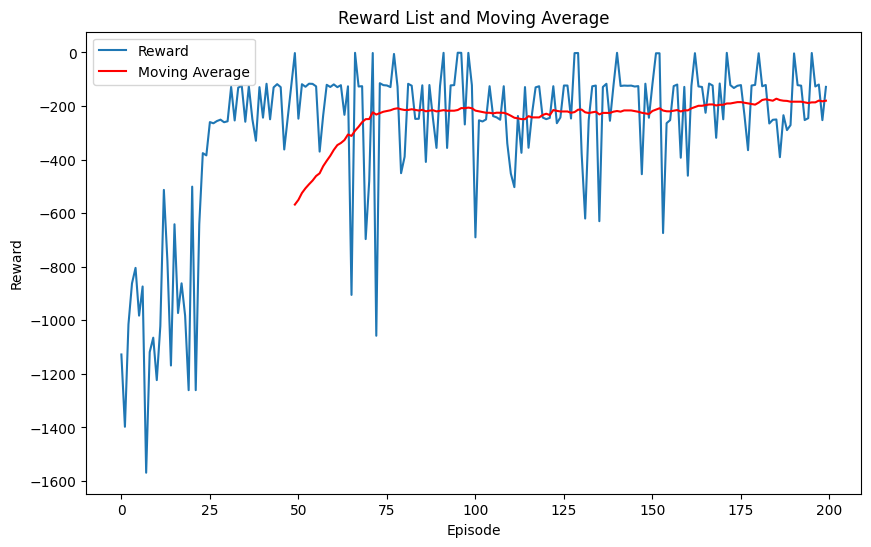

In [25]:
# Function to calculate the moving average
def moving_average(data):
    return np.convolve(data, np.ones(50) / 50, mode='valid')

# Calculate the moving average 
moving_avg = moving_average(reward_list_base)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(reward_list_base, label='Reward')
plt.plot(np.arange(50 - 1, len(reward_list_base)), moving_avg, label='Moving Average', color='red')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Reward List and Moving Average')
plt.legend()
plt.show()

In [26]:
base_DQN = DQNAgent()
base_DQN.load_model("base_DQN_Q_model.h5", "base_DQN_Target_model.h5")
test_reward_mean, test_reward_std = test_agent(agent=base_DQN, gif_path='base_dqn_pendulum.gif')
print("Test Mean: ", test_reward_mean)
print("Test Standard Deviation: ", test_reward_std)

Saved GIF to base_dqn_pendulum.gif
Test Mean:  -133.9437879797242
Test Standard Deviation:  82.94776649194426


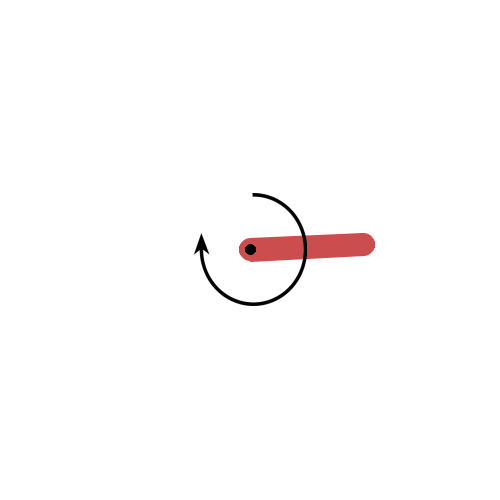

## Tuning the DQN (Model Improvement)

### Finding the optimum number of actions in the action space


#### Tuning the action space is important because it directly affects the agent's learning efficiency and effectiveness. The action space defines all the possible actions the agent can take, so its size influences how well the agent can explore and exploit the environment. If the action space is too limited, the agent might not have enough options to learn effectively, while a space that's too large can make the learning process overly complex and slow.

#### A well-tuned action space helps balance exploration, where the agent tries new actions to discover better strategies, and exploitation, where it uses known actions that yield high rewards. This balance is crucial for finding optimal policies. Additionally, an appropriately defined action space ensures that the complexity of the problem matches the environment and task requirements, making it easier for the agent to learn and perform effectively.

In [27]:
action_spaces_lst = [3, 4, 5, 6, 7, 8, 9, 10]
reward_list_as = [] 
reward_list_as_average = [] 
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for action_space in action_spaces_lst:
        print(f"---Training DQN with action dimension of {action_space}---")
        dqn_agent_tuning = DQNAgent(action_dim=action_space)
        reward_list_as.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_{action_space}_action.gif', tuning=True))
        print(f"Maximum reward from action dimension of {action_space}: {max(reward_list_as[i])}")
        print("------------------------------")
        i+=1

for s in range(len(action_spaces_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_as[s][k]+reward_list_as[s+8][k]+reward_list_as[s+16][k]))

    reward_list_as_average.append(lst)


Trial 1:
---Training DQN with action dimension of 3---
Episode: 5, Total Reward: -1376.8155719769636
Episode: 10, Total Reward: -1245.5513554624495
Episode: 15, Total Reward: -622.8769524144365
Episode: 20, Total Reward: -130.29649027839287
Episode: 25, Total Reward: -251.38827851706446
Episode: 30, Total Reward: -1.986857751660498
Episode: 35, Total Reward: -730.0778257960677
Episode: 40, Total Reward: -256.735592291924
Episode: 45, Total Reward: -370.1775387421998
Episode: 50, Total Reward: -2.44092999108631
Episode: 55, Total Reward: -121.06930251040572
Episode: 60, Total Reward: -1.61520153916821
Episode: 65, Total Reward: -121.6206703525081
Episode: 70, Total Reward: -249.95658976930326
Episode: 75, Total Reward: -119.84074712348061
Episode: 80, Total Reward: -126.52687920359269
Episode: 85, Total Reward: -579.105919461407
Episode: 90, Total Reward: -120.11206647952595
Episode: 95, Total Reward: -118.06533873027409
Episode: 100, Total Reward: -2.89660574192692
Episode: 105, Total 

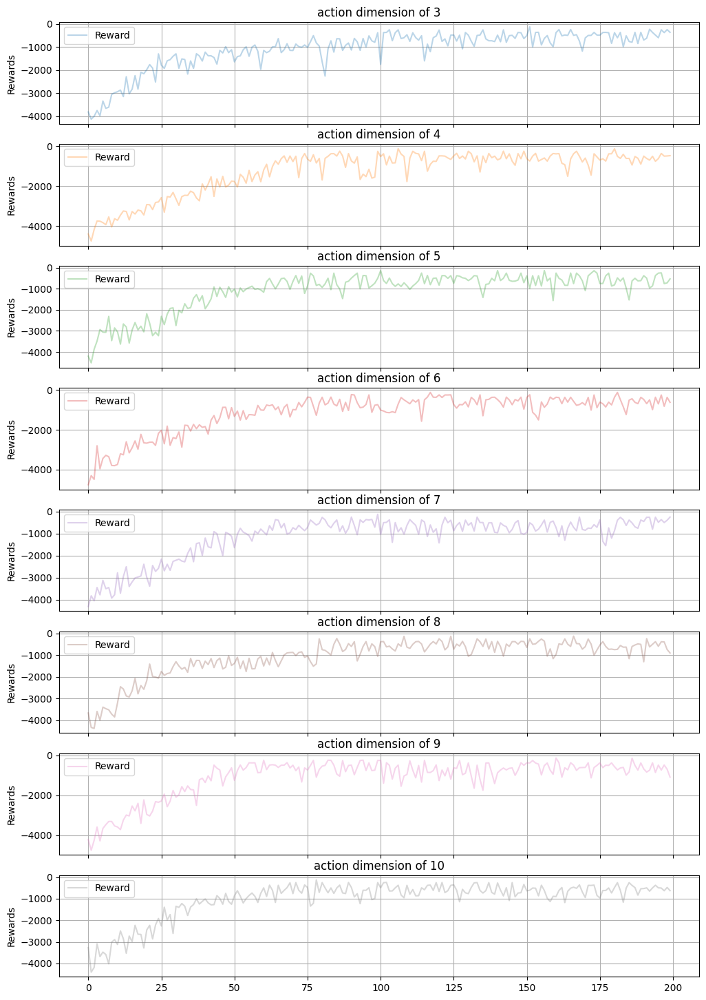

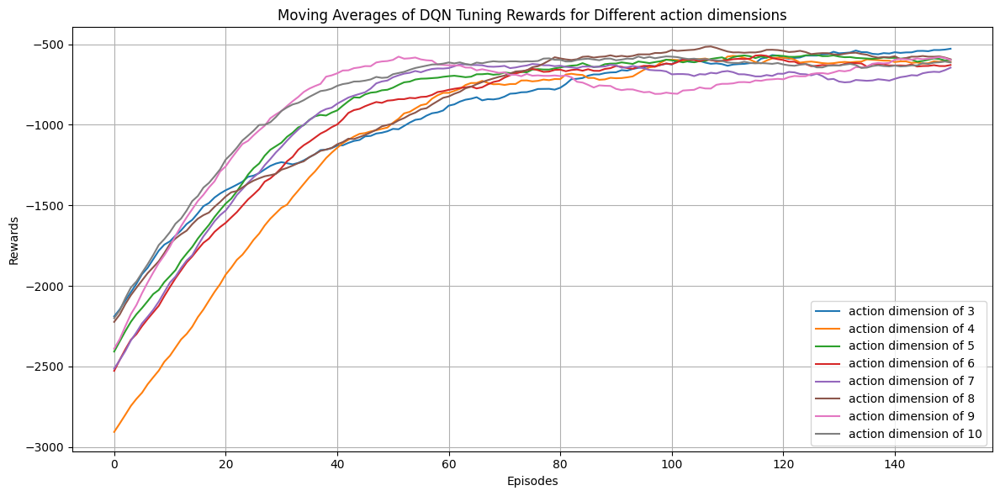

In [28]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(8, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:8]
for j in range(8):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_as_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_as_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'action dimension of {action_spaces_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='action dimension of 3', color=colors[0])
plt.plot(ma_reward_list[1], label='action dimension of 4', color=colors[1])
plt.plot(ma_reward_list[2], label='action dimension of 5', color=colors[2])
plt.plot(ma_reward_list[3], label='action dimension of 6', color=colors[3])
plt.plot(ma_reward_list[4], label='action dimension of 7', color=colors[4])
plt.plot(ma_reward_list[5], label='action dimension of 8', color=colors[5])
plt.plot(ma_reward_list[6], label='action dimension of 9', color=colors[6])
plt.plot(ma_reward_list[7], label='action dimension of 10', color=colors[7])

# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different action dimensions')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Finding the optimum memory buffer size

#### The memory buffer size is important to tune because it allows the agent to learn from a variety of experiences rather than just the most recent ones. If the memory buffer is too small, the agent might only learn from recent experiences and miss out on valuable information from earlier interactions, which can make learning less stable and less effective. Conversely, if the buffer is too large, it might slow down the training process and use more computational resources than necessary. Tuning the memory buffer size helps balance these factors, ensuring that the agent learns from a diverse set of experiences while keeping the training process efficient.

In [33]:
memory_lst = [100, 500, 1000, 5000, 10000, 20000, 40000]
reward_list_m = [] 
reward_list_m_average = [] 
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for memory in memory_lst:
        print(f"---Training DQN with memory size of {memory}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, memory_size=memory)
        reward_list_m.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_{memory}_memory.gif', tuning=True))
        print(f"Maximum reward from memory size of {memory}: {max(reward_list_m[i])}")
        print("------------------------------")
        i+=1

for s in range(len(memory_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_m[s][k]+reward_list_m[s+7][k]+reward_list_m[s+14][k]))

    reward_list_m_average.append(lst)

Trial 1:
---Training DQN with memory size of 100---
Episode: 5, Total Reward: -1511.6762317866269
Episode: 10, Total Reward: -1645.7501358694915
Episode: 15, Total Reward: -1547.2759589718328
Episode: 20, Total Reward: -1394.0749864964514
Episode: 25, Total Reward: -1521.8976389093434
Episode: 30, Total Reward: -1452.8714361477141
Episode: 35, Total Reward: -1537.2377799573126
Episode: 40, Total Reward: -1338.8561089351595
Episode: 45, Total Reward: -1359.4951388119925
Episode: 50, Total Reward: -1460.869119131829
Episode: 55, Total Reward: -1210.0741663644887
Episode: 60, Total Reward: -1521.2535968899654
Episode: 65, Total Reward: -1365.9426493669923
Episode: 70, Total Reward: -1243.047860265203
Episode: 75, Total Reward: -1098.9192080235973
Episode: 80, Total Reward: -1185.13535522835
Episode: 85, Total Reward: -1260.7445479910966
Episode: 90, Total Reward: -1232.5188819948323
Episode: 95, Total Reward: -1269.1346404830842
Episode: 100, Total Reward: -1038.7359316832583
Episode: 105

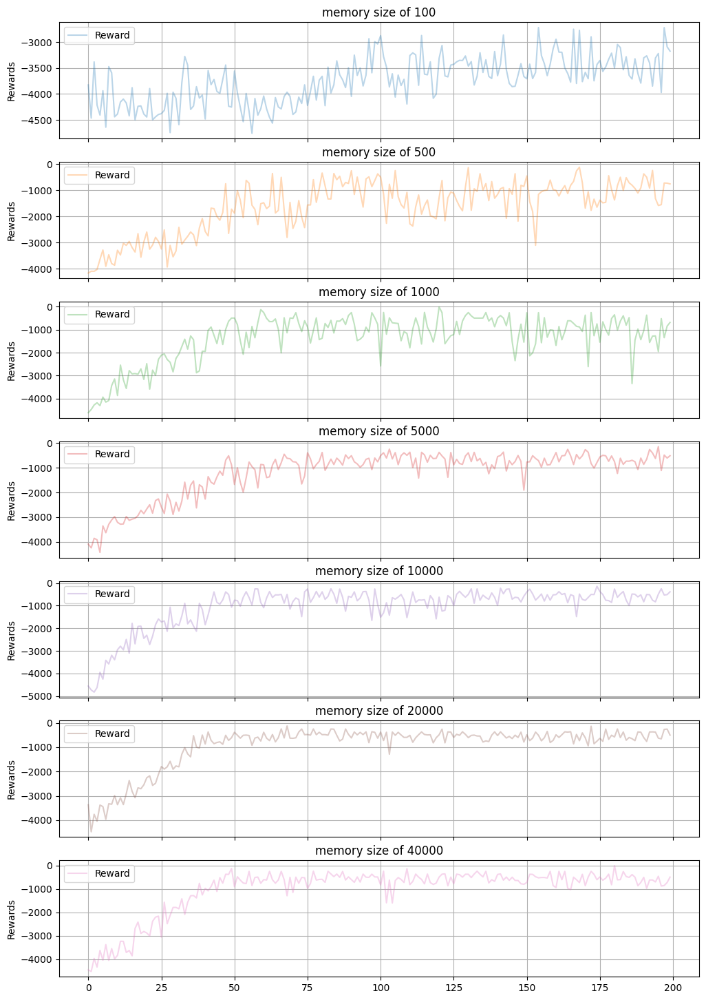

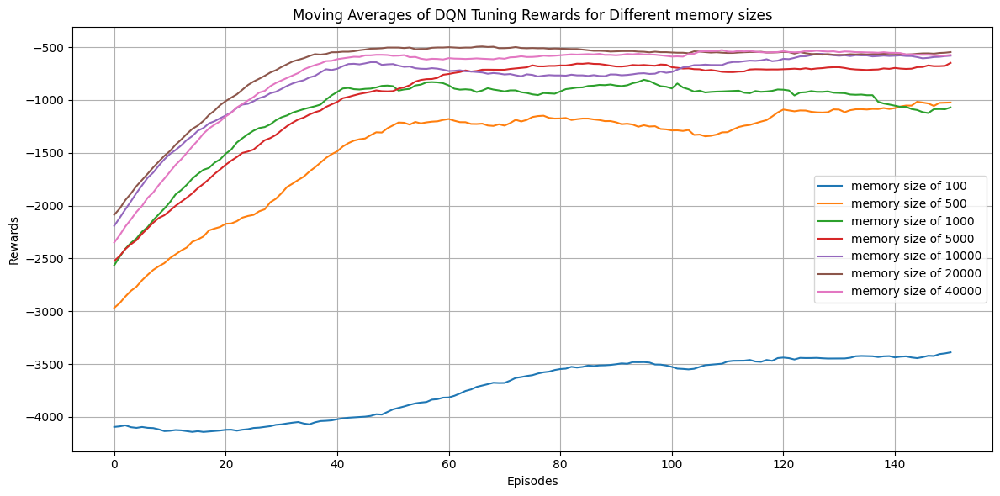

In [34]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(7, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:7]
for j in range(7):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_m_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_m_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'memory size of {memory_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='memory size of 100', color=colors[0])
plt.plot(ma_reward_list[1], label='memory size of 500', color=colors[1])
plt.plot(ma_reward_list[2], label='memory size of 1000', color=colors[2])
plt.plot(ma_reward_list[3], label='memory size of 5000', color=colors[3])
plt.plot(ma_reward_list[4], label='memory size of 10000', color=colors[4])
plt.plot(ma_reward_list[5], label='memory size of 20000', color=colors[5])
plt.plot(ma_reward_list[6], label='memory size of 40000', color=colors[6])

# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different memory sizes')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Finding the optimum target_update_freq

#### In a DQN, the target update frequency refers to how often the target network, which helps stabilize training, is updated with the weights of the main Q-network. This frequency is important because if the target network is updated too frequently, it can lead to instability and noisy learning since the target values are changing too quickly. On the other hand, if updates are too infrequent, the target network might not adequately reflect the latest state of the main Q-network, which can slow down learning and make the training less effective. Tuning this frequency helps strike a balance, ensuring stable and efficient learning by keeping the target network in sync with the main network at a reasonable pace.

In [7]:
target_update_freq_lst = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45]
reward_list_tuf = [] 
reward_list_tuf_average = []
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for target_update_freq_num in target_update_freq_lst:
        print(f"---Training DQN with target_update_freq of {target_update_freq_num}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, target_update_freq=target_update_freq_num, memory_size=20000)
        reward_list_tuf.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_target_update_{target_update_freq_num}.gif', tuning=True))
        print(f"Maximum reward from target_update_freq of {target_update_freq_num}: {max(reward_list_tuf[i])}")
        print("------------------------------")
        i+=1

for s in range(len(target_update_freq_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_tuf[s][k]+reward_list_tuf[s+10][k]+reward_list_tuf[s+20][k]))

    reward_list_tuf_average.append(lst)

Trial 1:
---Training DQN with target_update_freq of 1---


C:\Users\kier4\anaconda3\envs\gpu_env\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Episode: 5, Total Reward: -1460.6670117913839
Episode: 10, Total Reward: -1509.2287569014259
Episode: 15, Total Reward: -1538.8442885966165
Episode: 20, Total Reward: -1037.0978927292542
Episode: 25, Total Reward: -872.9106401571614
Episode: 30, Total Reward: -1056.1429639216042
Episode: 35, Total Reward: -781.4251709749187
Episode: 40, Total Reward: -908.7514121821697
Episode: 45, Total Reward: -862.8388742498609
Episode: 50, Total Reward: -641.4923230310558
Episode: 55, Total Reward: -767.6121174510148
Episode: 60, Total Reward: -510.24712106862006
Episode: 65, Total Reward: -248.44555727975376
Episode: 70, Total Reward: -516.0846219344404
Episode: 75, Total Reward: -125.23918205897967
Episode: 80, Total Reward: -259.89779292451806
Episode: 85, Total Reward: -3.1759085849063213
Episode: 90, Total Reward: -234.2818498883728
Episode: 95, Total Reward: -879.9977676725471
Episode: 100, Total Reward: -2.910546634757941
Episode: 105, Total Reward: -126.39758824667328
Episode: 110, Total Re

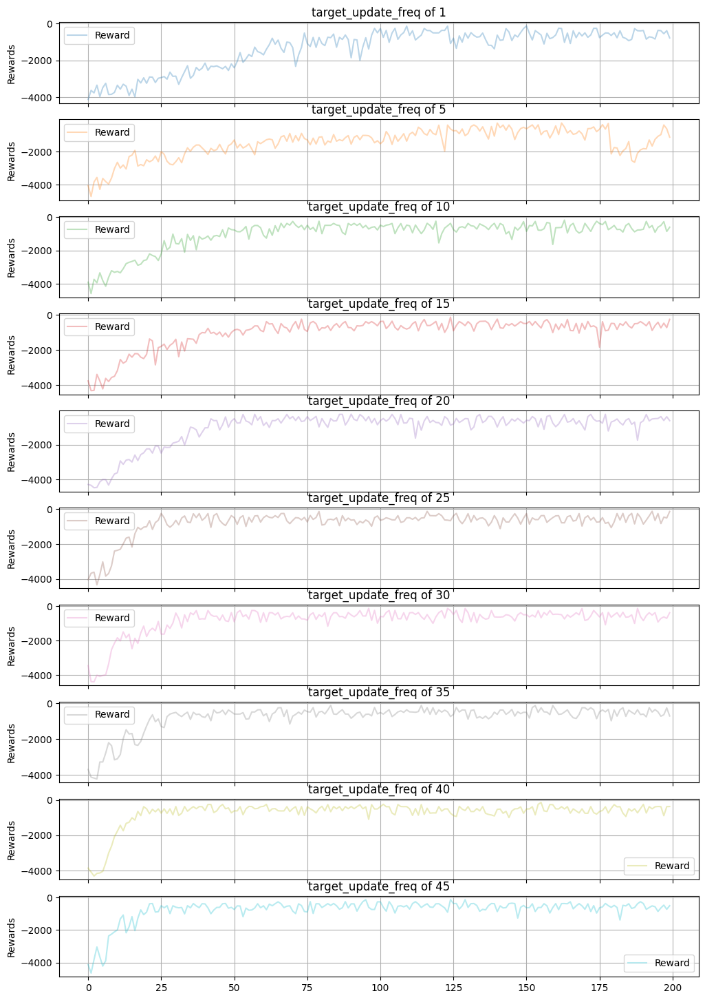

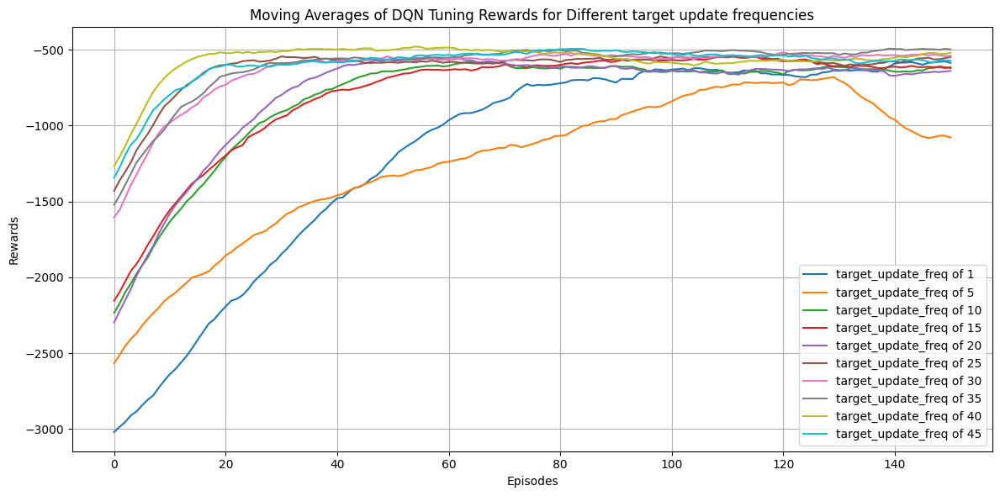

In [8]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(10, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:10]
for j in range(10):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_tuf_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_tuf_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'target_update_freq of {target_update_freq_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='target_update_freq of 1', color=colors[0])
plt.plot(ma_reward_list[1], label='target_update_freq of 5', color=colors[1])
plt.plot(ma_reward_list[2], label='target_update_freq of 10', color=colors[2])
plt.plot(ma_reward_list[3], label='target_update_freq of 15', color=colors[3])
plt.plot(ma_reward_list[4], label='target_update_freq of 20', color=colors[4])
plt.plot(ma_reward_list[5], label='target_update_freq of 25', color=colors[5])
plt.plot(ma_reward_list[6], label='target_update_freq of 30', color=colors[6])
plt.plot(ma_reward_list[7], label='target_update_freq of 35', color=colors[7])
plt.plot(ma_reward_list[8], label='target_update_freq of 40', color=colors[8])
plt.plot(ma_reward_list[9], label='target_update_freq of 45', color=colors[9])

# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different target update frequencies')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Finding the optimum epsilon

#### In a DQN, epsilon controls the exploration-exploitation trade-off by determining how often the agent chooses a random action rather than the best-known action. A high epsilon encourages more exploration, allowing the agent to try out different actions and discover potentially better strategies. However, too much exploration can make learning inefficient. Conversely, a low epsilon favors exploitation, where the agent relies mostly on known actions, which can lead to missing out on discovering better strategies. Tuning epsilon helps balance exploration and exploitation, ensuring that the agent learns effectively while also exploring enough to improve its performance.

In [8]:
epsilon_lst = [1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]
reward_list_e = [] 
reward_list_e_average = [] 
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for epsilon in epsilon_lst:
        print(f"---Training DQN with epsilon of {epsilon}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, target_update_freq=30, epsilon=epsilon, memory_size=20000)
        reward_list_e.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_epsilon_{epsilon}.gif', tuning=True))
        print(f"Maximum reward from epsilon of {epsilon}: {max(reward_list_e[i])}")
        print("------------------------------")
        i+=1

for s in range(len(epsilon_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_e[s][k]+reward_list_e[s+10][k]+reward_list_e[s+20][k]))

    reward_list_e_average.append(lst)

Trial 1:
---Training DQN with epsilon of 1.0---
Episode: 5, Total Reward: -1177.5362500544175
Episode: 10, Total Reward: -1094.501392732897
Episode: 15, Total Reward: -955.0440438613383
Episode: 20, Total Reward: -768.6276735241354
Episode: 25, Total Reward: -864.3649212439742
Episode: 30, Total Reward: -512.9297086434814
Episode: 35, Total Reward: -133.12041467495985
Episode: 40, Total Reward: -253.70700706960554
Episode: 45, Total Reward: -492.09931261109307
Episode: 50, Total Reward: -250.2483885849316
Episode: 55, Total Reward: -2.4258029372626564
Episode: 60, Total Reward: -126.84618821979652
Episode: 65, Total Reward: -252.23561462522196
Episode: 70, Total Reward: -276.64186927476476
Episode: 75, Total Reward: -2.044424018366457
Episode: 80, Total Reward: -126.36912747389759
Episode: 85, Total Reward: -2.20337792496006
Episode: 90, Total Reward: -120.78575649412366
Episode: 95, Total Reward: -349.0051364609334
Episode: 100, Total Reward: -237.9037605946181
Episode: 105, Total Rew

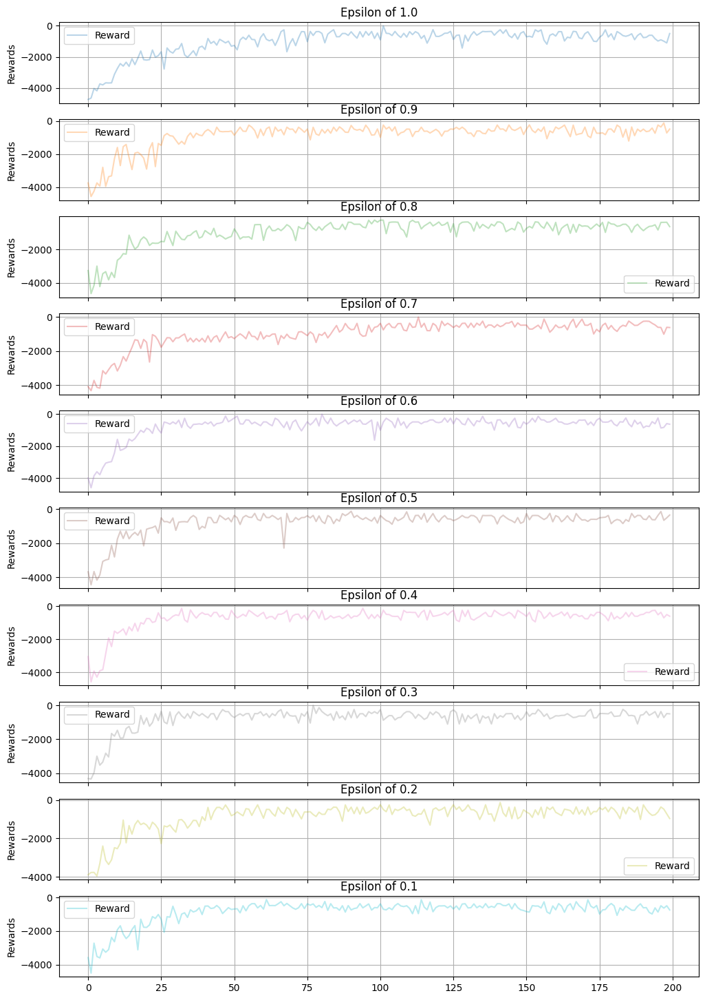

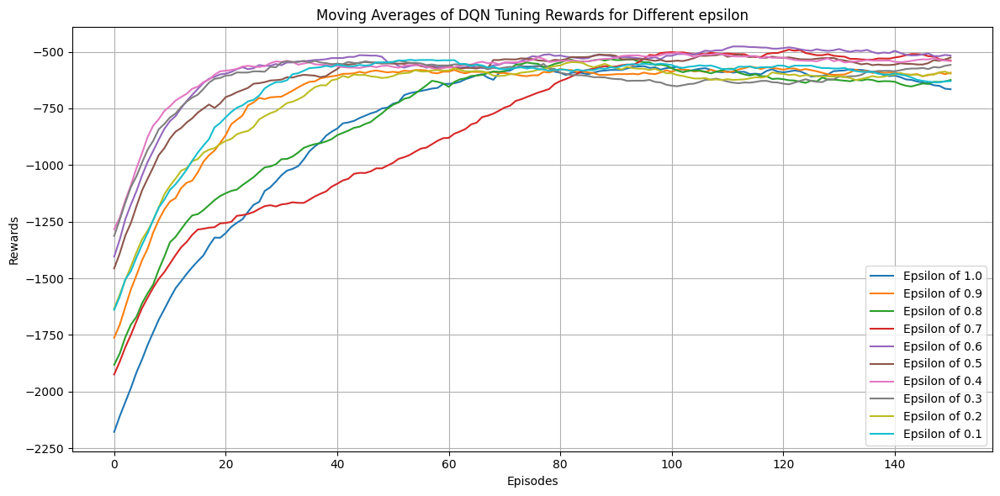

In [9]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(10, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:10]
for j in range(10):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_e_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_e_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'Epsilon of {epsilon_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='Epsilon of 1.0', color=colors[0])
plt.plot(ma_reward_list[1], label='Epsilon of 0.9', color=colors[1])
plt.plot(ma_reward_list[2], label='Epsilon of 0.8', color=colors[2])
plt.plot(ma_reward_list[3], label='Epsilon of 0.7', color=colors[3])
plt.plot(ma_reward_list[4], label='Epsilon of 0.6', color=colors[4])
plt.plot(ma_reward_list[5], label='Epsilon of 0.5', color=colors[5])
plt.plot(ma_reward_list[6], label='Epsilon of 0.4', color=colors[6])
plt.plot(ma_reward_list[7], label='Epsilon of 0.3', color=colors[7])
plt.plot(ma_reward_list[8], label='Epsilon of 0.2', color=colors[8])
plt.plot(ma_reward_list[9], label='Epsilon of 0.1', color=colors[9])

# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different epsilon')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Comparing between base DQN and semi-improved DQN

In [32]:
semi_improved_dqn_agent = DQNAgent(action_dim=3, epsilon=0.2, target_update_freq=30, memory_size=20000)
reward_list_semi_improved = train_agent(agent=semi_improved_dqn_agent, gif_path='semi_improved_dqn_pendulum.gif', tuning=True, evaluate_base=True)

Episode: 5, Total Reward: -1293.0704741364702
Episode: 10, Total Reward: -384.0186306820762
Episode: 15, Total Reward: -381.8451259303298
Episode: 20, Total Reward: -234.1166664970725
Episode: 25, Total Reward: -2.3852521958986976
Episode: 30, Total Reward: -3.2724825889494458
Episode: 35, Total Reward: -244.1243735866404
Episode: 40, Total Reward: -239.42139319901304
Episode: 45, Total Reward: -241.09453756209766
Episode: 50, Total Reward: -126.4638737867211
Episode: 55, Total Reward: -340.9706042893279
Episode: 60, Total Reward: -228.03777760569574
Episode: 65, Total Reward: -237.90773342523178
Episode: 70, Total Reward: -3.570378460238237
Episode: 75, Total Reward: -482.2795491129435
Episode: 80, Total Reward: -463.40618129078865
Episode: 85, Total Reward: -129.73513544212108
Episode: 90, Total Reward: -130.2804045297558
Episode: 95, Total Reward: -256.2074675139708
Episode: 100, Total Reward: -4.381557915183352
Episode: 105, Total Reward: -253.78914914024597
Episode: 110, Total Rew

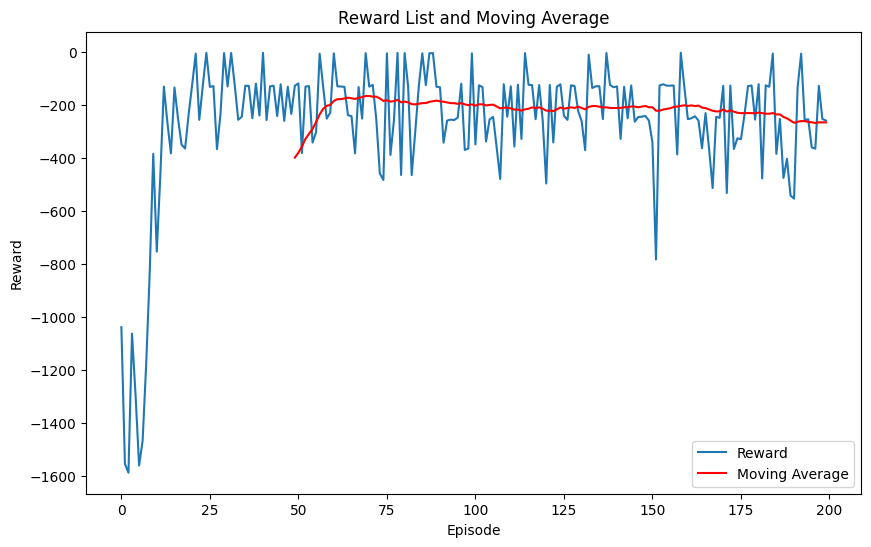

In [33]:
# Function to calculate the moving average
def moving_average(data):
    return np.convolve(data, np.ones(50) / 50, mode='valid')

# Calculate the moving average 
moving_avg = moving_average(reward_list_semi_improved)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(reward_list_semi_improved, label='Reward')
plt.plot(np.arange(50 - 1, len(reward_list_semi_improved)), moving_avg, label='Moving Average', color='red')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Reward List and Moving Average')
plt.legend()
plt.show()

In [35]:
semi_tuned_DQN = DQNAgent(action_dim=3, epsilon=0.2, target_update_freq=30, memory_size=20000)
semi_tuned_DQN.load_model("base_DQN_Q_model.h5", "base_DQN_Target_model.h5")
test_reward_mean, test_reward_std = test_agent(agent=semi_tuned_DQN, gif_path='semi_tuned_dqn_pendulum.gif')
print("Test Mean: ", test_reward_mean)
print("Test Standard Deviation: ", test_reward_std)

Saved GIF to semi_tuned_dqn_pendulum.gif
Test Mean:  -143.24932927271837
Test Standard Deviation:  85.96202929707583


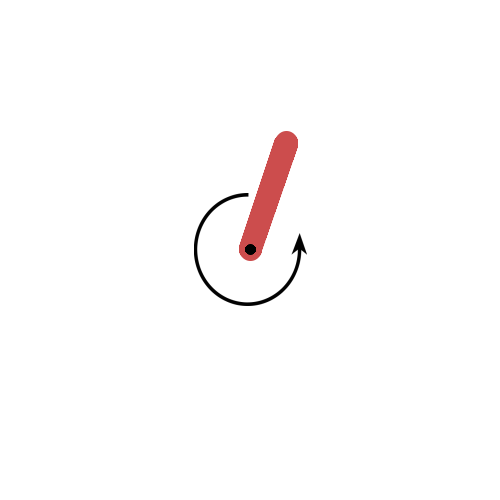

### Finding the optimum gamma

#### In a DQN, gamma represents the discount factor, which determines how much importance the agent gives to future rewards compared to immediate rewards. A high gamma means the agent values future rewards more, leading to a focus on long-term goals. Conversely, a low gamma makes the agent prioritize immediate rewards, focusing more on short-term gains. Tuning gamma is crucial because it affects how the agent balances between immediate and future rewards, influencing its overall learning strategy and performance in reaching long-term objectives.

In [15]:
gamma_lst = [1.0, 0.995, 0.99, 0.985, 0.98, 0.975, 0.97, 0.965, 0.96]
reward_list_gamma = [] 
reward_list_gamma_average = [] 
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for gamma in gamma_lst:
        print(f"---Training DQN with gamma of {gamma}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, epsilon=0.2, target_update_freq=30, gamma=gamma, memory_size=20000)
        reward_list_gamma.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_gamma_{gamma}.gif', tuning=True))
        print(f"Maximum reward from gamma of {gamma}: {max(reward_list_gamma[i])}")
        print("------------------------------")
        i+=1
        
for s in range(len(gamma_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_gamma[s][k]+reward_list_gamma[s+9][k]+reward_list_gamma[s+18][k]))

    reward_list_gamma_average.append(lst)

Trial 1:
---Training DQN with gamma of 1.0---
Episode: 5, Total Reward: -1425.567056091373
Episode: 10, Total Reward: -1262.938203988027
Episode: 15, Total Reward: -1037.9641888871836
Episode: 20, Total Reward: -1041.329519583412
Episode: 25, Total Reward: -1009.5582594549129
Episode: 30, Total Reward: -1208.5843741733281
Episode: 35, Total Reward: -1135.296060066128
Episode: 40, Total Reward: -1058.8502638054472
Episode: 45, Total Reward: -883.3139729205127
Episode: 50, Total Reward: -952.1131251223273
Episode: 55, Total Reward: -762.1072778521782
Episode: 60, Total Reward: -800.3683209236665
Episode: 65, Total Reward: -861.9009554489566
Episode: 70, Total Reward: -747.5966154209743
Episode: 75, Total Reward: -602.9676319530913
Episode: 80, Total Reward: -635.2964553400075
Episode: 85, Total Reward: -784.4632804650745
Episode: 90, Total Reward: -514.8162370589687
Episode: 95, Total Reward: -256.15100219627556
Episode: 100, Total Reward: -260.29728206180204
Episode: 105, Total Reward: 

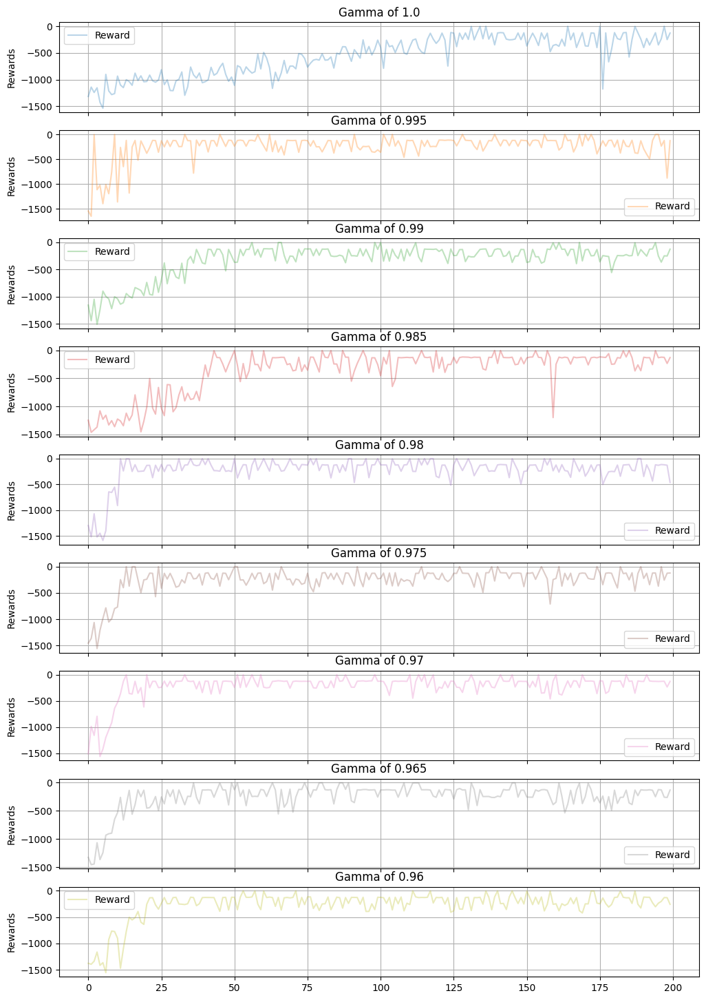

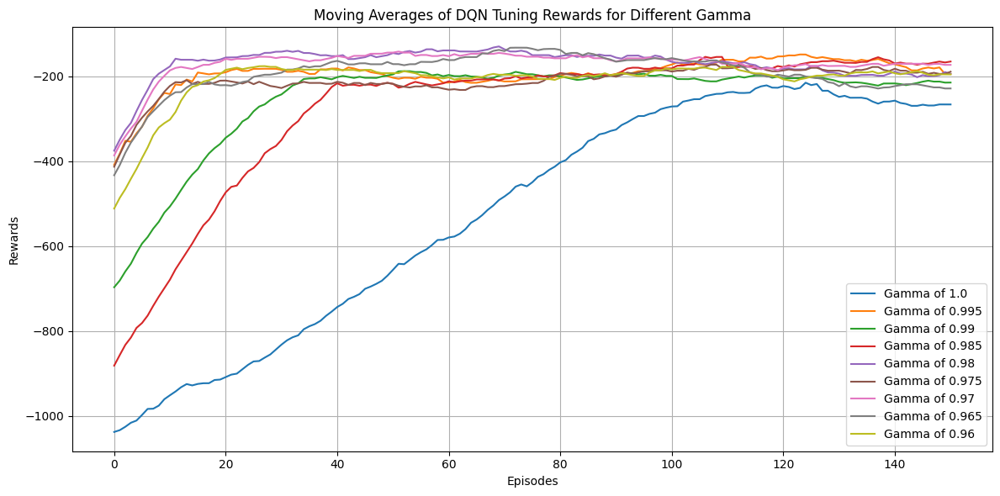

In [16]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(9, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:9]
for j in range(9):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_gamma[j]))

    # Plot the rewards
    axs[j].plot(reward_list_gamma[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'Gamma of {gamma_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='Gamma of 1.0', color=colors[0])
plt.plot(ma_reward_list[1], label='Gamma of 0.995', color=colors[1])
plt.plot(ma_reward_list[2], label='Gamma of 0.99', color=colors[2])
plt.plot(ma_reward_list[3], label='Gamma of 0.985', color=colors[3])
plt.plot(ma_reward_list[4], label='Gamma of 0.98', color=colors[4])
plt.plot(ma_reward_list[5], label='Gamma of 0.975', color=colors[5])
plt.plot(ma_reward_list[6], label='Gamma of 0.97', color=colors[6])
plt.plot(ma_reward_list[7], label='Gamma of 0.965', color=colors[7])
plt.plot(ma_reward_list[8], label='Gamma of 0.96', color=colors[8])


# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different Gamma')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Finding the optimum batch size

#### In a DQN, the batch size determines how many experiences from the memory buffer are used to update the Q-network at each training step. A larger batch size provides a more stable estimate of the gradients because it averages out the noise from individual experiences. However, it requires more memory and computation. A smaller batch size updates the network more frequently and can lead to faster training, but it might be less stable and more susceptible to noisy updates. Tuning the batch size helps balance between stable learning and computational efficiency, ensuring that the training process is both effective and manageable.

In [17]:
batch_size_lst = [32, 64, 128, 256, 512]
reward_list_bs = [] 
reward_list_bs_average = [] 
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for batch_size in batch_size_lst:
        print(f"---Training DQN with batch size of {batch_size}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, epsilon=0.2, gamma=0.99, target_update_freq=30, batch_size=batch_size, memory_size=20000)
        reward_list_bs.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_batch_size_{batch_size}.gif', tuning=True))
        print(f"Maximum reward from batch size of {batch_size}: {max(reward_list_bs[i])}")
        print("------------------------------")
        i+=1

for s in range(len(batch_size_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_bs[s][k]+reward_list_bs[s+5][k]+reward_list_bs[s+10][k]))

    reward_list_bs_average.append(lst)

Trial 1:
---Training DQN with batch size of 32---
Episode: 5, Total Reward: -1457.6745855035774
Episode: 10, Total Reward: -1482.428682136371
Episode: 15, Total Reward: -1014.7745326468611
Episode: 20, Total Reward: -1084.797694877565
Episode: 25, Total Reward: -1100.7041346087085
Episode: 30, Total Reward: -1082.9987989654712
Episode: 35, Total Reward: -1127.951279222995
Episode: 40, Total Reward: -132.16951064525094
Episode: 45, Total Reward: -303.7220227711713
Episode: 50, Total Reward: -627.5885222287163
Episode: 55, Total Reward: -1091.4047375582052
Episode: 60, Total Reward: -132.12161435435377
Episode: 65, Total Reward: -127.33981214420433
Episode: 70, Total Reward: -240.8919144532687
Episode: 75, Total Reward: -244.7464428523956
Episode: 80, Total Reward: -238.7557965254807
Episode: 85, Total Reward: -125.70426647264607
Episode: 90, Total Reward: -128.88082014358682
Episode: 95, Total Reward: -124.67096010839225
Episode: 100, Total Reward: -316.86559364477824
Episode: 105, Tota

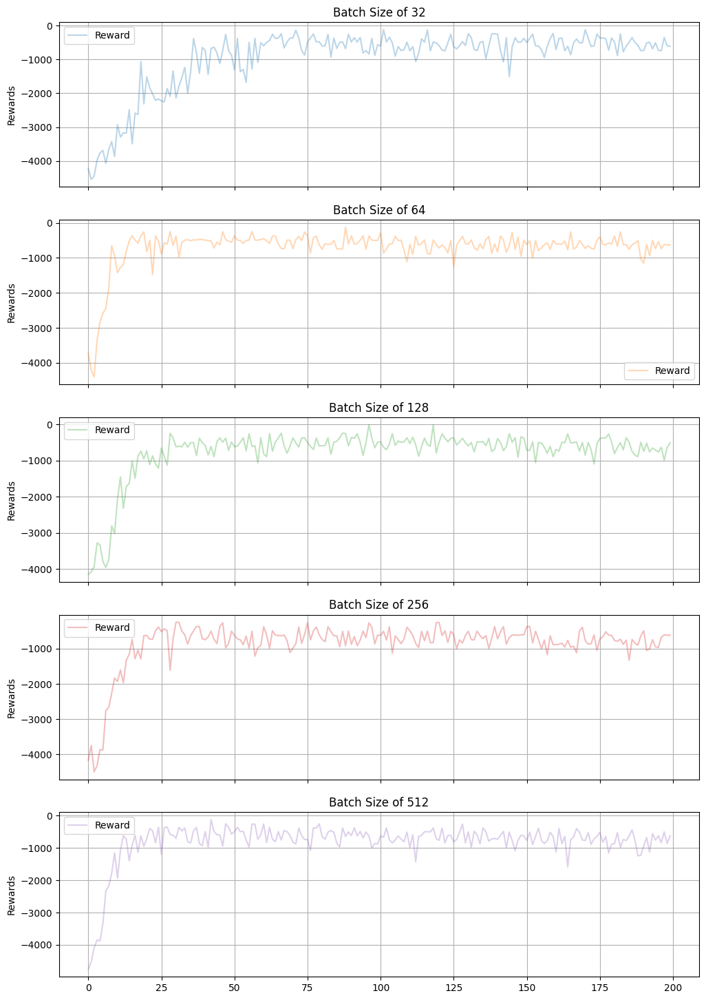

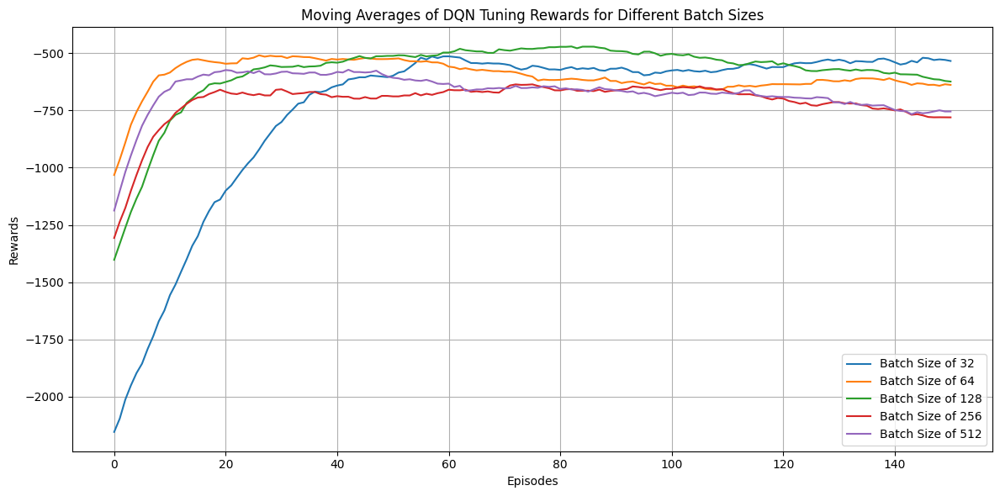

In [18]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(5, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:5]
for j in range(5):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_bs_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_bs_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'Batch Size of {batch_size_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='Batch Size of 32', color=colors[0])
plt.plot(ma_reward_list[1], label='Batch Size of 64', color=colors[1])
plt.plot(ma_reward_list[2], label='Batch Size of 128', color=colors[2])
plt.plot(ma_reward_list[3], label='Batch Size of 256', color=colors[3])
plt.plot(ma_reward_list[4], label='Batch Size of 512', color=colors[4])


# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different Batch Sizes')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Finding the optimum learning rate

#### In a DQN, the learning rate controls how much the Q-network's weights are adjusted during each update. A high learning rate can make the training process faster but might lead to unstable updates and overshooting optimal values. On the other hand, a low learning rate results in more stable updates but can slow down the learning process and make it harder to converge to a good policy. Tuning the learning rate helps ensure that the Q-network learns efficiently while maintaining stability and avoiding issues like oscillations or slow convergence.

In [20]:
learning_rate_lst = [0.00001, 0.0001, 0.0002, 0.001, 0.002, 0.01, 0.02, 0.1, 0.2]
reward_list_lr = [] 
reward_list_lr_average = []
i=0
for x in range(3):
    print(f"Trial {x+1}:")
    for learning_rate in learning_rate_lst:
        print(f"---Training DQN with learning rate of {learning_rate}---")
        dqn_agent_tuning = DQNAgent(action_dim=3, epsilon=0.2, gamma=0.99, target_update_freq=30, batch_size=128, memory_size=20000)
        reward_list_lr.append(train_agent(agent=dqn_agent_tuning, gif_path=f'DQN/dqn_pendulum_learning_rate_{learning_rate}.gif', tuning=True))
        print(f"Maximum reward from learning rate of {learning_rate}: {max(reward_list_lr[i])}")
        print("------------------------------")
        i+=1

for s in range(len(learning_rate_lst)):
    lst=[]
    for k in range(200):
        lst.append(np.mean(reward_list_lr[s][k]+reward_list_lr[s+9][k]+reward_list_lr[s+18][k]))

    reward_list_lr_average.append(lst)

Trial 1:
---Training DQN with learning rate of 1e-05---
Episode: 5, Total Reward: -1168.8206449690892
Episode: 10, Total Reward: -1368.113852414588
Episode: 15, Total Reward: -927.434055357714
Episode: 20, Total Reward: -751.1145059823527
Episode: 25, Total Reward: -123.70005692866638
Episode: 30, Total Reward: -862.2991108479526
Episode: 35, Total Reward: -245.21363530032204
Episode: 40, Total Reward: -124.49110665580716
Episode: 45, Total Reward: -1.718440510871577
Episode: 50, Total Reward: -117.50588094133005
Episode: 55, Total Reward: -404.57133228522423
Episode: 60, Total Reward: -119.73500382087418
Episode: 65, Total Reward: -127.0164920858033
Episode: 70, Total Reward: -1.511748134011798
Episode: 75, Total Reward: -126.84269960436316
Episode: 80, Total Reward: -128.46526865640058
Episode: 85, Total Reward: -123.05093946344756
Episode: 90, Total Reward: -125.81623771847372
Episode: 95, Total Reward: -130.58480822777068
Episode: 100, Total Reward: -125.48795570966846
Episode: 105

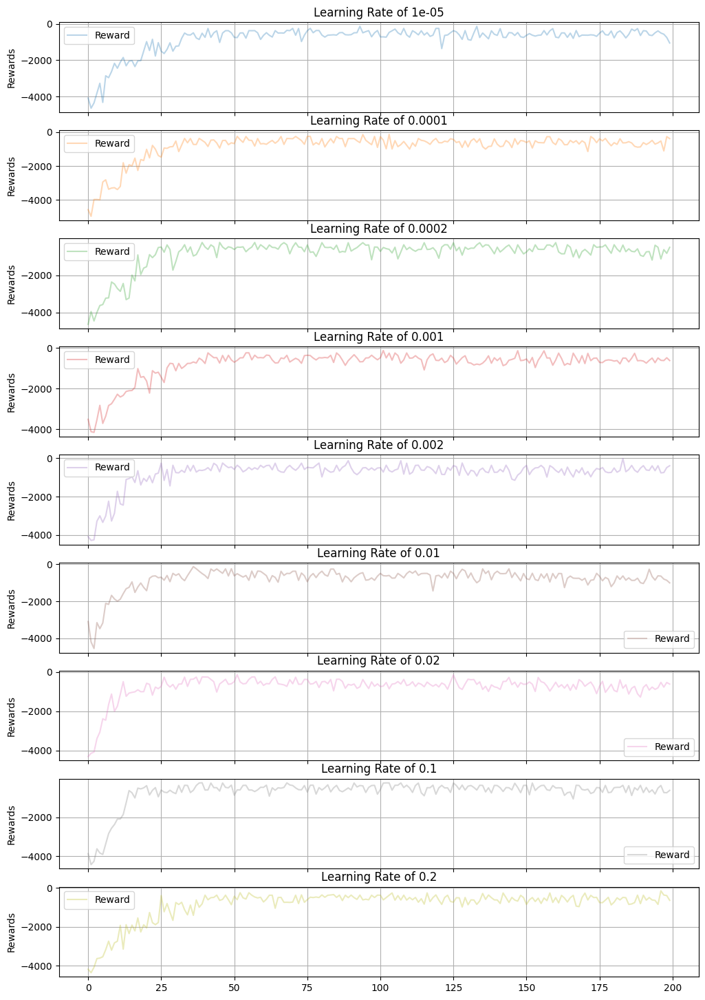

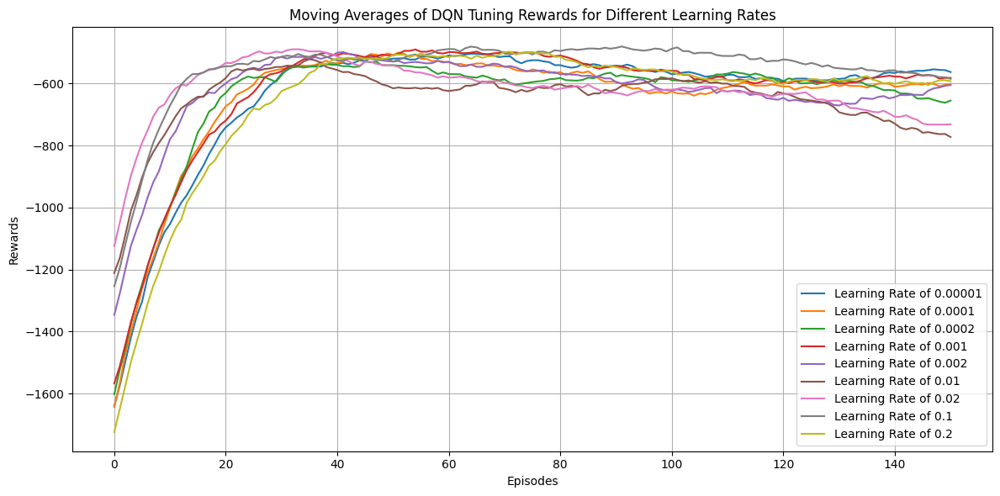

In [21]:
# Plot the reward lists
ma_reward_list = []
def moving_average(data, window_size=50):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Create subplots
fig, axs = plt.subplots(9, 1, figsize=(12, 18), sharex=True)

colors = plt.get_cmap('tab10').colors[:9]
for j in range(9):
    # Calculate moving average
    ma_reward_list.append(moving_average(reward_list_lr_average[j]))

    # Plot the rewards
    axs[j].plot(reward_list_lr_average[j], label='Reward', color=colors[j], alpha=0.3)
    axs[j].set_title(f'Learning Rate of {learning_rate_lst[j]}')
    axs[j].set_ylabel('Rewards')
    axs[j].legend()
    axs[j].grid(True)

# Plot all moving averages on a single graph
plt.figure(figsize=(12, 6))
plt.plot(ma_reward_list[0], label='Learning Rate of 0.00001', color=colors[0])
plt.plot(ma_reward_list[1], label='Learning Rate of 0.0001', color=colors[1])
plt.plot(ma_reward_list[2], label='Learning Rate of 0.0002', color=colors[2])
plt.plot(ma_reward_list[3], label='Learning Rate of 0.001', color=colors[3])
plt.plot(ma_reward_list[4], label='Learning Rate of 0.002', color=colors[4])
plt.plot(ma_reward_list[5], label='Learning Rate of 0.01', color=colors[5])
plt.plot(ma_reward_list[6], label='Learning Rate of 0.02', color=colors[6])
plt.plot(ma_reward_list[7], label='Learning Rate of 0.1', color=colors[7])
plt.plot(ma_reward_list[8], label='Learning Rate of 0.2', color=colors[8])


# Adding title and labels
plt.title('Moving Averages of DQN Tuning Rewards for Different Learning Rates')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend(loc='lower right')
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Final DQN model

In [29]:
final_improved_dqn_agent = DQNAgent(action_dim=3, epsilon=0.2, gamma=0.99, target_update_freq=30, batch_size=128, memory_size=20000, learning_rate=0.001)
reward_list_final_improved = train_agent(agent=final_improved_dqn_agent, gif_path='final_dqn_pendulum.gif')

Episode: 5, Total Reward: -1450.5473408617447
Episode: 10, Total Reward: -1302.7716694127685
Episode: 15, Total Reward: -1375.8772963184404
Episode: 20, Total Reward: -1155.652301838756
Episode: 25, Total Reward: -687.9567553613657
Episode: 30, Total Reward: -633.0403032011392
Episode: 35, Total Reward: -240.24710385958286
Episode: 40, Total Reward: -242.82289166978342
Episode: 45, Total Reward: -372.4033136323396
Episode: 50, Total Reward: -366.08384796506544
Success rate of 26.0%
Episode: 55, Total Reward: -128.7631822627807
Episode: 60, Total Reward: -237.18015528385763
Episode: 65, Total Reward: -230.38905107228686
Episode: 70, Total Reward: -119.27797527276131
Episode: 75, Total Reward: -121.92453045166125
Episode: 80, Total Reward: -234.36129253422308
Episode: 85, Total Reward: -232.7694790661853
Episode: 90, Total Reward: -119.80628924140724
Episode: 95, Total Reward: -122.4086782400595

Success rate of 86.0% reached. Stopping training.
Saved GIF to final_dqn_pendulum.gif

Last 

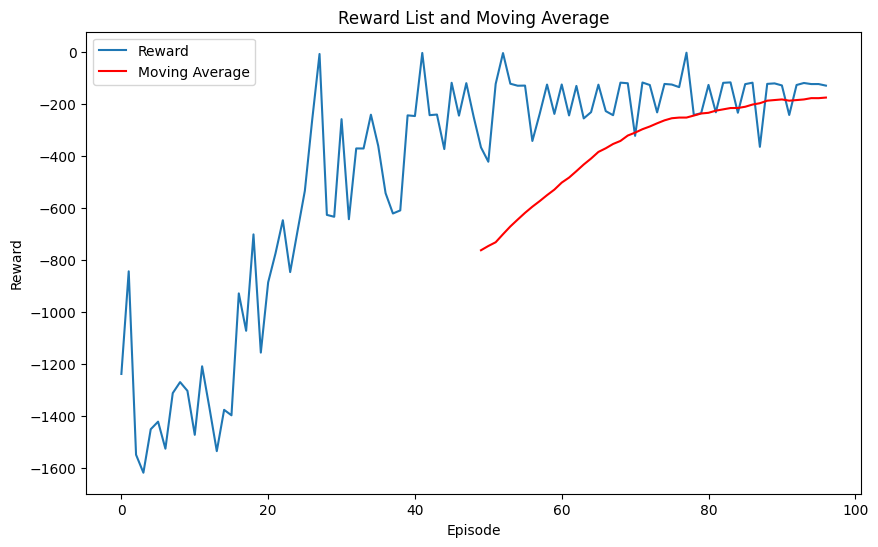

In [30]:
# Function to calculate the moving average
def moving_average(data):
    return np.convolve(data, np.ones(50) / 50, mode='valid')

# Calculate the moving average 
moving_avg = moving_average(reward_list_final_improved)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(reward_list_final_improved, label='Reward')
plt.plot(np.arange(50 - 1, len(reward_list_final_improved)), moving_avg, label='Moving Average', color='red')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Reward List and Moving Average')
plt.legend()
plt.show()

In [31]:
best_DQN = DQNAgent(action_dim=3, epsilon=0.2, gamma=0.99, target_update_freq=30, batch_size=128, memory_size=20000, learning_rate=0.001)
best_DQN.load_model("final_DQN_Q_model.h5", "final_DQN_Target_model.h5")
test_reward_mean, test_reward_std = test_agent(agent=best_DQN, gif_path='final_dqn_pendulum.gif')
print("Test Mean: ", test_reward_mean)
print("Test Standard Deviation: ", test_reward_std)

Saved GIF to final_dqn_pendulum.gif
Test Mean:  -167.6845643758084
Test Standard Deviation:  76.18859964101632


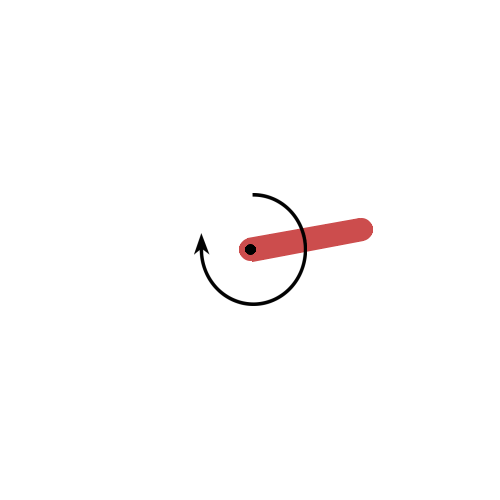

## DDPG

### Deep Deterministic Policy Gradient (DDPG) is a reinforcement learning algorithm designed for environments with continuous action spaces, like the pendulum environment. It is an actor-critic method, which means it consists of two neural networks: an actor and a critic. The actor learns to select actions based on the current state, while the critic evaluates the action by predicting the expected return.

### There are 5 components in a DDPG:
### 1. Actor Network (Chef)
### 2. Critic Network (Food Critic)
### 3. Target Networks, which include the Target Actor and Target Critic (Cookbook/Recipe)
### 4. Replay Buffer (Memory)
### 5. Exploration Noise (Gaussian/ OU noise)

### How does the Actor Network (Chef), Critic Network (Food Critic) and Target Networks (Cookbook/Recipe) work together?
#### The Actor Network (Chef) will try different methods (actions) to cook a dish based on the current recipe (policy). Next, the Critic Network (Food Critic) will taste and evaluate the dish based on the Target Networks' (Cookbook/Recipe) standards (Q-values), and let the Chef know how good or how bad the food is.

### references:
### DDPG model: https://keras.io/examples/rl/ddpg_pendulum/
### OU noise: https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process


### Noise, Buffer and Agent Classes

In [36]:
# ----------------------------- OUNoise Class ----------------------------
class OUActionNoise:
    def __init__(self, mean, std_deviation, theta=0.15, dt=1e-2, x_initial=None):
        """
        mean: Mean of the noise
        std_deviation: Standard deviation of the noise
        theta: Speed of mean reversion, higher value would cause the noise to revert to the mean more quickly, resulting in faster stabilisation
        dt: Time increment, affects the size of updates in each time step
        x_initial: Initial value of the noise
        """
        self.theta = theta
        self.mean = mean
        self.std_dev = std_deviation
        self.dt = dt
        self.x_initial = x_initial
        self.reset()

    def __call__(self):
        # Formula taken from https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process.
        x = (
            self.x_prev
            + self.theta * (self.mean - self.x_prev) * self.dt
            + self.std_dev * np.sqrt(self.dt) * np.random.normal(size=self.mean.shape)
        )
        # next noise is dependent on current noise
        self.x_prev = x
        return x

    def reset(self):
        if self.x_initial is not None:
            self.x_prev = self.x_initial
        else:
            self.x_prev = np.zeros_like(self.mean)

In [37]:
# ----------------------------- Buffer Class -----------------------------
class Buffer:
    def __init__(self, buffer_capacity=100000, batch_size=64, num_states=3, num_actions=1):
        self.num_states = num_states
        self.num_actions = num_actions
        
        # maximum number of "experiences" to store
        self.buffer_capacity = buffer_capacity
        # number of tuples to train on.
        self.batch_size = batch_size
        # number of times record() was called.
        self.buffer_counter = 0

        # store values in numpy arrays for experience replay
        self.state_buffer = np.zeros((self.buffer_capacity, self.num_states))
        self.action_buffer = np.zeros((self.buffer_capacity, self.num_actions))
        self.reward_buffer = np.zeros((self.buffer_capacity, 1))
        self.next_state_buffer = np.zeros((self.buffer_capacity, self.num_states))

    # Takes (s,a,r,s') obervation tuple as input
    def record(self, obs_tuple):
        # Set index to zero if buffer_capacity is exceeded,
        # replacing old records
        index = self.buffer_counter % self.buffer_capacity

        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]

        self.buffer_counter += 1

    @tf.function  #tensorflow function decorator builds static graph out of the update function to speed up the function
    def update(self, state_batch, action_batch, reward_batch, next_state_batch, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        # calculate critic loss and update critic
        with tf.GradientTape() as tape:
            target_actions = target_actor(next_state_batch, training=True)
            y = reward_batch + gamma * target_critic([next_state_batch, target_actions], training=True)
            critic_value = critic_model([state_batch, action_batch], training=True)
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, critic_model.trainable_variables)
        critic_optimizer.apply_gradients(zip(critic_grad, critic_model.trainable_variables))

        # calculate actor loss andd update actor
        with tf.GradientTape() as tape:
            actions = actor_model(state_batch, training=True)
            critic_value = critic_model([state_batch, actions], training=True)
            actor_loss = -tf.math.reduce_mean(critic_value) # negative since we want to maximise the critic value (predicted q value)

        actor_grad = tape.gradient(actor_loss, actor_model.trainable_variables)
        actor_optimizer.apply_gradients(zip(actor_grad, actor_model.trainable_variables))
        
        return critic_loss, actor_loss
        
    # retrieve random state, action, reward and next state batches for learning
    def learn(self, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        # Get sampling range
        record_range = min(self.buffer_counter, self.buffer_capacity)
        # Randomly sample indices
        batch_indices = np.random.choice(record_range, self.batch_size)

        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[batch_indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[batch_indices])
        reward_batch = tf.cast(tf.convert_to_tensor(self.reward_buffer[batch_indices]), dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[batch_indices])

        critic_loss, actor_loss = self.update(state_batch, action_batch, reward_batch, next_state_batch, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer)
        return critic_loss, actor_loss


In [45]:
# ----------------------------- DDPG agent class -----------------------------
class DDPGAgent:
    def __init__(self, build_actor, build_critic, buffer_class=Buffer, ou_action_noise_class=OUActionNoise, buffer_capacity=100000, batch_size=64, gamma=0.99, tau=0.005, critic_lr=0.002, actor_lr=0.001, total_episodes=100, noise_std_dev=0.2):
        self.env = gym.make('Pendulum-v1', g=9.81, render_mode="rgb_array")

        # get action and state space
        self.num_states = self.env.observation_space.shape[0]    # 3 states
        self.num_actions = self.env.action_space.shape[0]    # 1 action
        self.upper_bound = self.env.action_space.high[0] # 2.0
        self.lower_bound = self.env.action_space.low[0] # -2.0

        
        self.buffer = buffer_class(buffer_capacity, batch_size, self.num_states, self.num_actions)
        self.total_episodes = total_episodes
        self.gamma = gamma
        self.tau = tau
        self.actor_lr = actor_lr
        self.critic_lr = critic_lr

        # initialize models
        self.actor_model = build_actor()
        self.critic_model = build_critic()
        self.target_actor = build_actor()
        self.target_critic = build_critic()

        # make the weights equal initially
        self.target_actor.set_weights(self.actor_model.get_weights())
        self.target_critic.set_weights(self.critic_model.get_weights())

        # optimizers
        self.actor_optimizer = tf.keras.optimizers.Adam(actor_lr)
        self.critic_optimizer = tf.keras.optimizers.Adam(critic_lr)

        # noise
        self.noise_std_dev = noise_std_dev  # the lower the value, the more the model would exploit. The higher the value, the more the model would explore
        self.ou_noise = ou_action_noise_class(mean=np.zeros(1), std_deviation=float(self.noise_std_dev) * np.ones(1))

        # episode history
        self.ep_reward_list = [] # to store reward history of each episode
        self.avg_reward_list = []  # to store average reward history of last few episodes

        self.avg_ep_critic_loss_list = []  # to store average critic losses during training 
        self.avg_ep_actor_loss_list = []  # to store average actor losses during training


    def policy(self, state):
        sampled_actions = tf.squeeze(self.actor_model(state))
        noise = self.ou_noise()
        legal_action = np.clip(sampled_actions.numpy() + noise, self.lower_bound, self.upper_bound) # add noise to action and clipping to ensure that action is within the bounds
        return [np.squeeze(legal_action)]

    def update_target(self, target_weights, weights, tau):    # update the target parameters slowly, based on the value of tau
        for (a, b) in zip(target_weights, weights):
            a.assign(b * tau + a * (1 - tau))

    def train(self, save_gif_path='ddpg_pendulum_training.gif'):
        for ep in range(self.total_episodes):
            prev_state, _ = self.env.reset()
            prev_state = np.array(prev_state)
            episodic_reward = 0
            frames = [] # list to store each frame (time step) to save it into a gif
            critic_losses = []
            actor_losses = []

            episode_start_time = time.time()
            while True:
                tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
                action = self.policy(tf_prev_state)

                # recieve state and reward from environment
                state, reward, terminated, truncated, _ = self.env.step(action) # terminated = True, when the pendulum pole is upright. Trucated = True, when the episode reaches a time step of 200
                done = terminated or truncated

                self.buffer.record((prev_state, action, reward, state))
                episodic_reward += reward

                critic_loss, actor_loss = self.buffer.learn(self.target_actor, self.actor_model, self.target_critic, self.critic_model, self.gamma, self.actor_optimizer, self.critic_optimizer)
                critic_losses.append(critic_loss)
                actor_losses.append(actor_loss)

                # update target networks
                self.update_target(self.target_actor.variables, self.actor_model.variables, self.tau)
                self.update_target(self.target_critic.variables, self.critic_model.variables, self.tau)

                frames.append(self.env.render())

                # end episode (i.e. break the loop) when `done` is True
                if done:
                    break

                prev_state = state

            episode_duration = time.time() - episode_start_time # get the duration of an episode

            avg_critic_loss = np.mean(critic_losses)
            avg_actor_loss = np.mean(actor_losses)

            self.avg_ep_critic_loss_list.append(avg_critic_loss)
            self.avg_ep_actor_loss_list.append(avg_actor_loss)

            self.ep_reward_list.append(episodic_reward)
            # mean of last 40 episodes
            avg_reward = np.mean(self.ep_reward_list[-10:])
            print(f"Episode {ep+1} | Average Reward: {avg_reward} | Episode Duration: {episode_duration:.2f} seconds | Average Critic Loss: {avg_critic_loss} | Average Actor Loss: {avg_actor_loss}")
            self.avg_reward_list.append(avg_reward)
    


        imageio.mimsave(save_gif_path, frames, fps=30, loop=0)   # save the frames for the last model 

    def plot_training_graphs(self, title='DDPG Base Model Training Graph'):
        fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(22, 20))

        fig.suptitle(title, size=20)

        ax1.set_title("Reward per Episode")
        ax1.plot(self.ep_reward_list, label='Episode Reward')
        ax1.plot(self.avg_reward_list, label='Moving Average Reward (Last 10 Episodes)')
        ax1.set_xlabel("Episode")
        ax1.set_ylabel("Reward")
        ax1.legend()
        ax1.grid(True, linestyle='--', axis='y')
        ax1.set_facecolor("black")

        ax2.set_title("Average Actor Loss per Episode")
        ax2.plot(self.avg_ep_actor_loss_list, color='red')
        ax2.set_xlabel("Episode")
        ax2.set_ylabel("Loss")
        ax2.grid(True, linestyle='--', axis='y')
        ax2.set_facecolor("black")

        ax3.set_title("Average Critic Loss per Episode",)
        ax3.plot(self.avg_ep_critic_loss_list, color='purple')
        ax3.set_xlabel("Episode")
        ax3.set_ylabel("Loss")
        ax3.grid(True, linestyle='--', axis='y')
        ax3.set_facecolor("black")

        plt.show()

    def get_reward_list(self):
        return self.ep_reward_list, self.avg_reward_list
        
    def get_loss_list(self):
        return self.avg_ep_critic_loss_list, self.avg_ep_actor_loss_list


### Base Actor and Critic Models

In [39]:
def build_ddpg_actor():
    # initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(32, activation="relu")(inputs)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_ddpg_critic():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(32, activation="relu")(concat)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model

In [41]:
base_ddpg = DDPGAgent(build_actor=build_ddpg_actor, build_critic=build_ddpg_critic, total_episodes=200)
base_ddpg.train(save_gif_path='base_ddpg.gif')

Episode 0 | Average Reward: -1484.539061038354 | Episode Duration: 2.19 seconds | Average Critic Loss: 10.582674980163574 | Average Actor Loss: 6.235406398773193
Episode 1 | Average Reward: -1632.5845985253954 | Episode Duration: 1.88 seconds | Average Critic Loss: 1.111997127532959 | Average Actor Loss: 12.66303825378418
Episode 2 | Average Reward: -1480.3420501105945 | Episode Duration: 1.86 seconds | Average Critic Loss: 0.7195723056793213 | Average Actor Loss: 18.202713012695312
Episode 3 | Average Reward: -1371.9176297070226 | Episode Duration: 1.88 seconds | Average Critic Loss: 0.4608212411403656 | Average Actor Loss: 23.665990829467773
Episode 4 | Average Reward: -1357.4692585370813 | Episode Duration: 1.86 seconds | Average Critic Loss: 0.3707013726234436 | Average Actor Loss: 29.680957794189453
Episode 5 | Average Reward: -1350.5635379400092 | Episode Duration: 1.91 seconds | Average Critic Loss: 0.3741859197616577 | Average Actor Loss: 35.25141143798828
Episode 6 | Average R

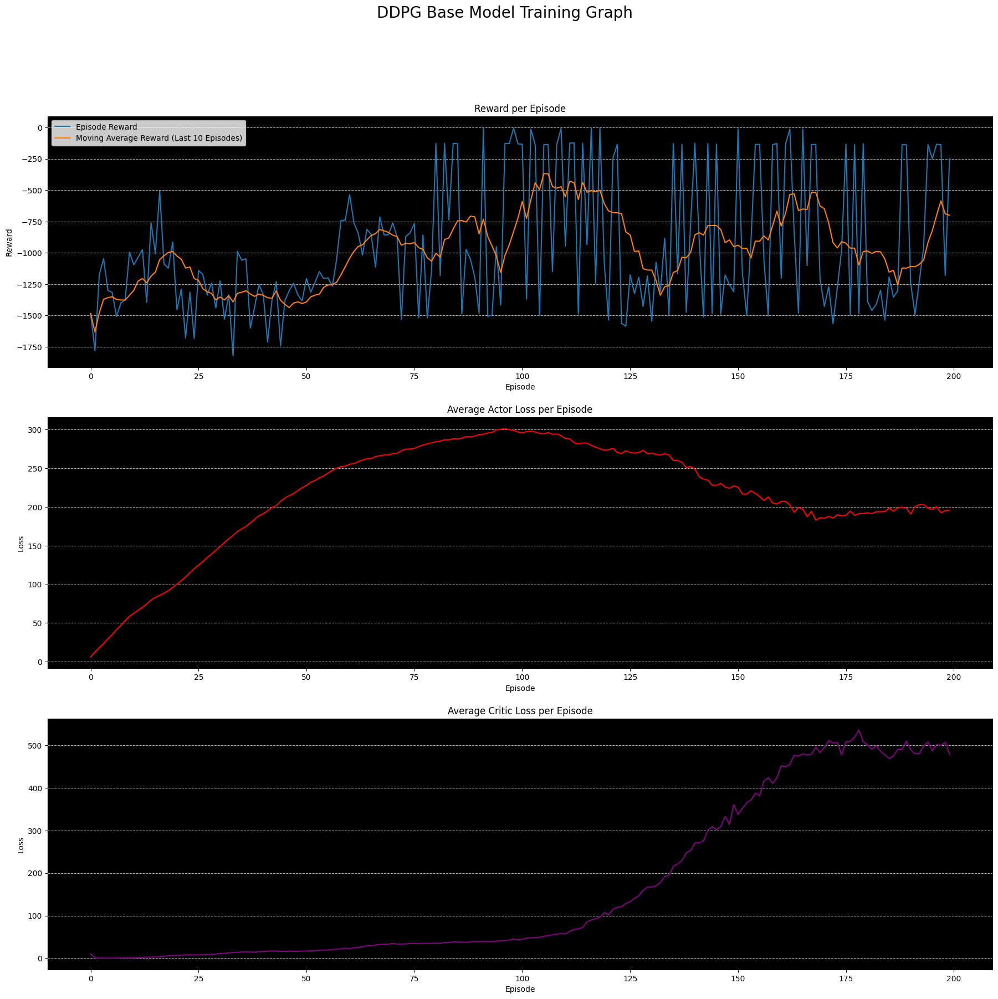

In [42]:
base_ddpg.plot_training_graphs()

# DDPG Improvement

## Improvement 1: Increasing the complexity of actor and critic networks

In [43]:
def build_actor_1():
    # Initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_critic_1():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)
    action_out = layers.Dense(32, activation="relu")(action_out)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model

In [44]:
ddpg_1 = DDPGAgent(build_actor=build_actor_1, build_critic=build_critic_1, total_episodes=200) #buffer_capacity=100000, batch_size=64, gamma=0.99, tau=0.005, critic_lr=0.002, actor_lr=0.001, total_episodes=200, noise_std_dev=0.2
ddpg_1.train(save_gif_path='DDPG/ddpg_1.gif')

ddpg_1_ep_reward_list, ddpg_1_avg_reward_list = ddpg_1.get_reward_list()
ddpg_1_avg_ep_critic_loss_list, ddpg_1_avg_ep_actor_loss_list = ddpg_1.get_loss_list()

Episode 0 | Average Reward: -1052.1521773415952 | Episode Duration: 2.98 seconds | Average Critic Loss: 1.252772331237793 | Average Actor Loss: 6.356297492980957
Episode 1 | Average Reward: -1082.524424819032 | Episode Duration: 2.51 seconds | Average Critic Loss: 0.08643490076065063 | Average Actor Loss: 10.796008110046387
Episode 2 | Average Reward: -1318.6461275514287 | Episode Duration: 2.47 seconds | Average Critic Loss: 0.08006241172552109 | Average Actor Loss: 15.375444412231445
Episode 3 | Average Reward: -1368.5810148310234 | Episode Duration: 2.48 seconds | Average Critic Loss: 0.1245696172118187 | Average Actor Loss: 20.591859817504883
Episode 4 | Average Reward: -1405.1886965456486 | Episode Duration: 2.46 seconds | Average Critic Loss: 0.18695604801177979 | Average Actor Loss: 25.964468002319336
Episode 5 | Average Reward: -1419.1265760613105 | Episode Duration: 2.52 seconds | Average Critic Loss: 0.14823292195796967 | Average Actor Loss: 31.776161193847656
Episode 6 | Ave

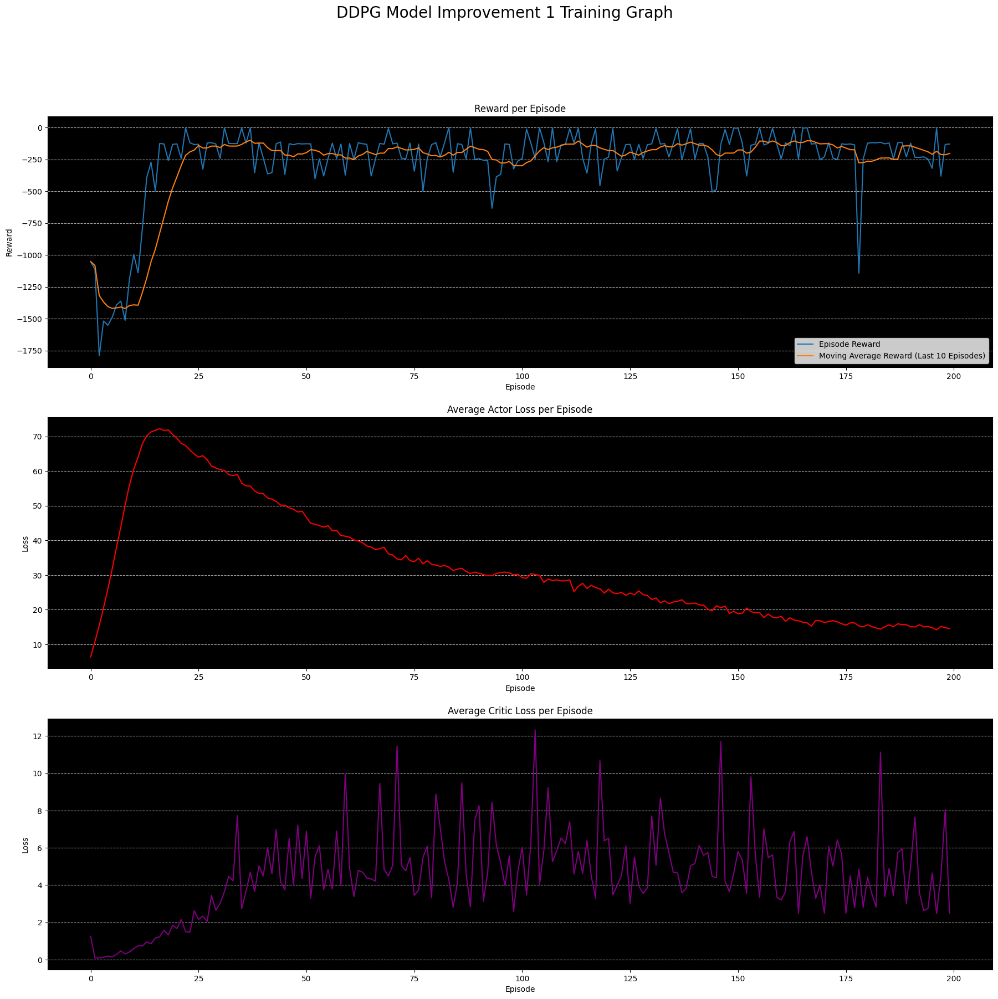

In [46]:
ddpg_1.plot_training_graphs(title='DDPG Model Improvement 1 Training Graph')

## Improvement 2: Finding the best noise function to use (OU Noise or Parameter Space Noise (PSN))

#### Reference https://soeren-kirchner.medium.com/deep-deterministic-policy-gradient-ddpg-with-and-without-ornstein-uhlenbeck-process-e6d272adfc3 
#### PSN: https://arxiv.org/pdf/1706.01905 

### Creating DDPG model with PSN

In [47]:
class PSNActionNoise:
    def __init__(self, initial_stddev=0.2, desired_distance=0.1, adaptation_coefficient=1.01, shape=(1,)):
        """
        Parameters:
        initial_stddev: Initial standard deviation of the noise.
        desired_distance: Target distance between noisy and original actions for adaptation.
        adaptation_coefficient: Factor to adapt the noise standard deviation.
        shape: Shape of the action space
        """
        self.stddev = initial_stddev
        self.desired_distance = desired_distance
        self.adaptation_coefficient = adaptation_coefficient
        self.shape = shape

    def __call__(self, actor, state):
        noisy_actor = self.add_noise(actor) # Create a noisy version of the actor
        original_action = actor(state)   # Get action from the original actor
        noisy_action = noisy_actor(state)   # Get action from the noisy actor

        distance = np.mean(np.square(original_action - noisy_action)) # Compute the distance between original and noisy actions
        
         # Adapt noise standard deviation based on the distance
        if distance > self.desired_distance:
            self.stddev /= self.adaptation_coefficient
        else:
            self.stddev *= self.adaptation_coefficient

        return noisy_action.numpy().flatten()  # Return noisy action

    def add_noise(self, actor):
        noisy_actor = tf.keras.models.clone_model(actor) # Clone the actor model
        # Add Gaussian noise to each weight of the cloned model
        noisy_actor.set_weights([w + np.random.normal(0, self.stddev, size=w.shape) for w in actor.get_weights()])
        return noisy_actor

In [48]:
# ----------------------------- Buffer Class -----------------------------
class Buffer:
    def __init__(self, buffer_capacity=100000, batch_size=64, num_states=3, num_actions=1):
        self.num_states = num_states
        self.num_actions = num_actions
        
        # maximum number of "experiences" to store
        self.buffer_capacity = buffer_capacity
        # number of tuples to train on.
        self.batch_size = batch_size
        # number of times record() was called.
        self.buffer_counter = 0

        # store values in numpy arrays for experience replay
        self.state_buffer = np.zeros((self.buffer_capacity, self.num_states))
        self.action_buffer = np.zeros((self.buffer_capacity, self.num_actions))
        self.reward_buffer = np.zeros((self.buffer_capacity, 1))
        self.next_state_buffer = np.zeros((self.buffer_capacity, self.num_states))

    # Takes (s,a,r,s') obervation tuple as input
    def record(self, obs_tuple):
        # Set index to zero if buffer_capacity is exceeded,
        # replacing old records
        index = self.buffer_counter % self.buffer_capacity

        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]

        self.buffer_counter += 1

    @tf.function  #tensorflow function decorator builds static graph out of the update function to speed up the function
    def update(self, state_batch, action_batch, reward_batch, next_state_batch, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        # calculate critic loss and update critic
        with tf.GradientTape() as tape:
            target_actions = target_actor(next_state_batch, training=True)
            y = reward_batch + gamma * target_critic([next_state_batch, target_actions], training=True)
            critic_value = critic_model([state_batch, action_batch], training=True)
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, critic_model.trainable_variables)
        critic_optimizer.apply_gradients(zip(critic_grad, critic_model.trainable_variables))

        # calculate actor loss andd update actor
        with tf.GradientTape() as tape:
            actions = actor_model(state_batch, training=True)
            critic_value = critic_model([state_batch, actions], training=True)
            actor_loss = -tf.math.reduce_mean(critic_value) # negative since we want to maximise the critic value (predicted q value)

        actor_grad = tape.gradient(actor_loss, actor_model.trainable_variables)
        actor_optimizer.apply_gradients(zip(actor_grad, actor_model.trainable_variables))
        
        return critic_loss, actor_loss
        
    # retrieve random state, action, reward and next state batches for learning
    def learn(self, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        # Get sampling range
        record_range = min(self.buffer_counter, self.buffer_capacity)
        # Randomly sample indices
        batch_indices = np.random.choice(record_range, self.batch_size)

        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[batch_indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[batch_indices])
        reward_batch = tf.cast(tf.convert_to_tensor(self.reward_buffer[batch_indices]), dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[batch_indices])

        critic_loss, actor_loss = self.update(state_batch, action_batch, reward_batch, next_state_batch, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer)
        return critic_loss, actor_loss


In [49]:
class DDPG_PSN_Agent:
    def __init__(self, build_actor, build_critic, buffer_class=Buffer, psn_action_noise_class=PSNActionNoise, buffer_capacity=100000, batch_size=64, gamma=0.99, tau=0.005, critic_lr=0.002, actor_lr=0.001, total_episodes=100, noise_std_dev=0.2, desired_distance=0.1):
        self.env = gym.make('Pendulum-v1', g=9.81, render_mode="rgb_array")

        # get action and state space
        self.num_states = self.env.observation_space.shape[0]    # 3 states
        self.num_actions = self.env.action_space.shape[0]    # 1 action
        self.upper_bound = self.env.action_space.high[0] # 2.0
        self.lower_bound = self.env.action_space.low[0] # -2.0

        self.buffer = buffer_class(buffer_capacity, batch_size, self.num_states, self.num_actions)
        self.total_episodes = total_episodes
        self.gamma = gamma
        self.tau = tau
        self.actor_lr = actor_lr
        self.critic_lr = critic_lr

        # initialize models
        self.actor_model = build_actor()
        self.critic_model = build_critic()
        self.target_actor = build_actor()
        self.target_critic = build_critic()

        # make the weights equal initially
        self.target_actor.set_weights(self.actor_model.get_weights())
        self.target_critic.set_weights(self.critic_model.get_weights())

        # optimizers
        self.actor_optimizer = tf.keras.optimizers.Adam(actor_lr)
        self.critic_optimizer = tf.keras.optimizers.Adam(critic_lr)

        # noise
        self.noise_std_dev = noise_std_dev
        self.psn_noise = psn_action_noise_class(initial_stddev=noise_std_dev, desired_distance=desired_distance, shape=(self.num_actions,))

        # episode history
        self.ep_reward_list = [] # to store reward history of each episode
        self.avg_reward_list = []  # to store average reward history of last few episodes

        self.avg_ep_critic_loss_list = []  # to store average critic losses during training 
        self.avg_ep_actor_loss_list = []  # to store average actor losses during training

    def policy(self, state):
        sampled_actions = tf.squeeze(self.actor_model(state))
        noise = self.psn_noise(self.actor_model, state)
        legal_action = np.clip(sampled_actions.numpy() + noise, self.lower_bound, self.upper_bound) # add noise to action and clipping to ensure that action is within the bounds
        return [np.squeeze(legal_action)]

    def update_target(self, target_weights, weights, tau):    # update the target parameters slowly, based on the value of tau
        for (a, b) in zip(target_weights, weights):
            a.assign(b * tau + a * (1 - tau))

    def train(self, save_gif_path='ddpg_pendulum_training.gif'):
        for ep in range(self.total_episodes):
            prev_state, _ = self.env.reset()
            prev_state = np.array(prev_state)
            episodic_reward = 0
            frames = [] # list to store each frame (time step) to save it into a gif
            critic_losses = []
            actor_losses = []

            episode_start_time = time.time()
            while True:
                tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
                action = self.policy(tf_prev_state)

                # receive state and reward from environment
                state, reward, terminated, truncated, _ = self.env.step(action) # terminated = True, when the pendulum pole is upright. Trucated = True, when the episode reaches a time step of 200
                done = terminated or truncated

                self.buffer.record((prev_state, action, reward, state))
                episodic_reward += reward

                critic_loss, actor_loss = self.buffer.learn(self.target_actor, self.actor_model, self.target_critic, self.critic_model, self.gamma, self.actor_optimizer, self.critic_optimizer)
                critic_losses.append(critic_loss)
                actor_losses.append(actor_loss)

                # update target networks
                self.update_target(self.target_actor.variables, self.actor_model.variables, self.tau)
                self.update_target(self.target_critic.variables, self.critic_model.variables, self.tau)

                frames.append(self.env.render())

                # end episode (i.e. break the loop) when `done` is True
                if done:
                    break

                prev_state = state

            episode_duration = time.time() - episode_start_time # get the duration of an episode

            avg_critic_loss = np.mean(critic_losses)
            avg_actor_loss = np.mean(actor_losses)

            self.avg_ep_critic_loss_list.append(avg_critic_loss)
            self.avg_ep_actor_loss_list.append(avg_actor_loss)

            self.ep_reward_list.append(episodic_reward)
            # mean of last 40 episodes
            avg_reward = np.mean(self.ep_reward_list[-10:])
            print(f"Episode {ep+1} | Average Reward: {avg_reward} | Episode Duration: {episode_duration:.2f} seconds | Average Critic Loss: {avg_critic_loss} | Average Actor Loss: {avg_actor_loss}")
            self.avg_reward_list.append(avg_reward)

        imageio.mimsave(save_gif_path, frames, fps=30, loop=0)   # save the frames for the last model 

    def plot_training_graphs(self, title='DDPG Base Model Training Graph'):
        fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(22, 20))

        fig.suptitle(title, size=20)

        ax1.set_title("Reward per Episode")
        ax1.plot(self.ep_reward_list, label='Episode Reward')
        ax1.plot(self.avg_reward_list, label='Moving Average Reward (Last 10 Episodes)')
        ax1.set_xlabel("Episode")
        ax1.set_ylabel("Reward")
        ax1.legend()
        ax1.grid(True, linestyle='--', axis='y')
        ax1.set_facecolor("black")

        ax2.set_title("Average Actor Loss per Episode")
        ax2.plot(self.avg_ep_actor_loss_list, color='red')
        ax2.set_xlabel("Episode")
        ax2.set_ylabel("Loss")
        ax2.grid(True, linestyle='--', axis='y')
        ax2.set_facecolor("black")

        ax3.set_title("Average Critic Loss per Episode",)
        ax3.plot(self.avg_ep_critic_loss_list, color='purple')
        ax3.set_xlabel("Episode")
        ax3.set_ylabel("Loss")
        ax3.grid(True, linestyle='--', axis='y')
        ax3.set_facecolor("black")

        plt.show()

    def get_reward_list(self):
        return self.ep_reward_list, self.avg_reward_list
        
    def get_loss_list(self):
        return self.avg_ep_critic_loss_list, self.avg_ep_actor_loss_list


### Training DDPG PSN

In [50]:
def build_actor_2():
    # Initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_critic_2():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)
    action_out = layers.Dense(32, activation="relu")(action_out)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model

In [53]:
ddpg_2 = DDPG_PSN_Agent(build_actor=build_actor_2, build_critic=build_critic_2, total_episodes=200)
ddpg_2.train(save_gif_path='DDPG/ddpg_2.gif')

Episode 1 | Average Reward: -1571.5911725194333 | Episode Duration: 8.22 seconds | Average Critic Loss: 2.061032772064209 | Average Actor Loss: 8.513164520263672
Episode 2 | Average Reward: -1475.7201211295906 | Episode Duration: 7.72 seconds | Average Critic Loss: 0.12482854723930359 | Average Actor Loss: 14.444469451904297
Episode 3 | Average Reward: -1502.3182978909165 | Episode Duration: 7.87 seconds | Average Critic Loss: 0.10042843222618103 | Average Actor Loss: 19.891887664794922
Episode 4 | Average Reward: -1513.8617149151435 | Episode Duration: 7.74 seconds | Average Critic Loss: 0.19551384449005127 | Average Actor Loss: 25.217500686645508
Episode 5 | Average Reward: -1526.0520339371853 | Episode Duration: 7.53 seconds | Average Critic Loss: 0.2367762327194214 | Average Actor Loss: 31.367597579956055
Episode 6 | Average Reward: -1530.4780607725997 | Episode Duration: 7.52 seconds | Average Critic Loss: 0.25499382615089417 | Average Actor Loss: 37.7415657043457
Episode 7 | Aver

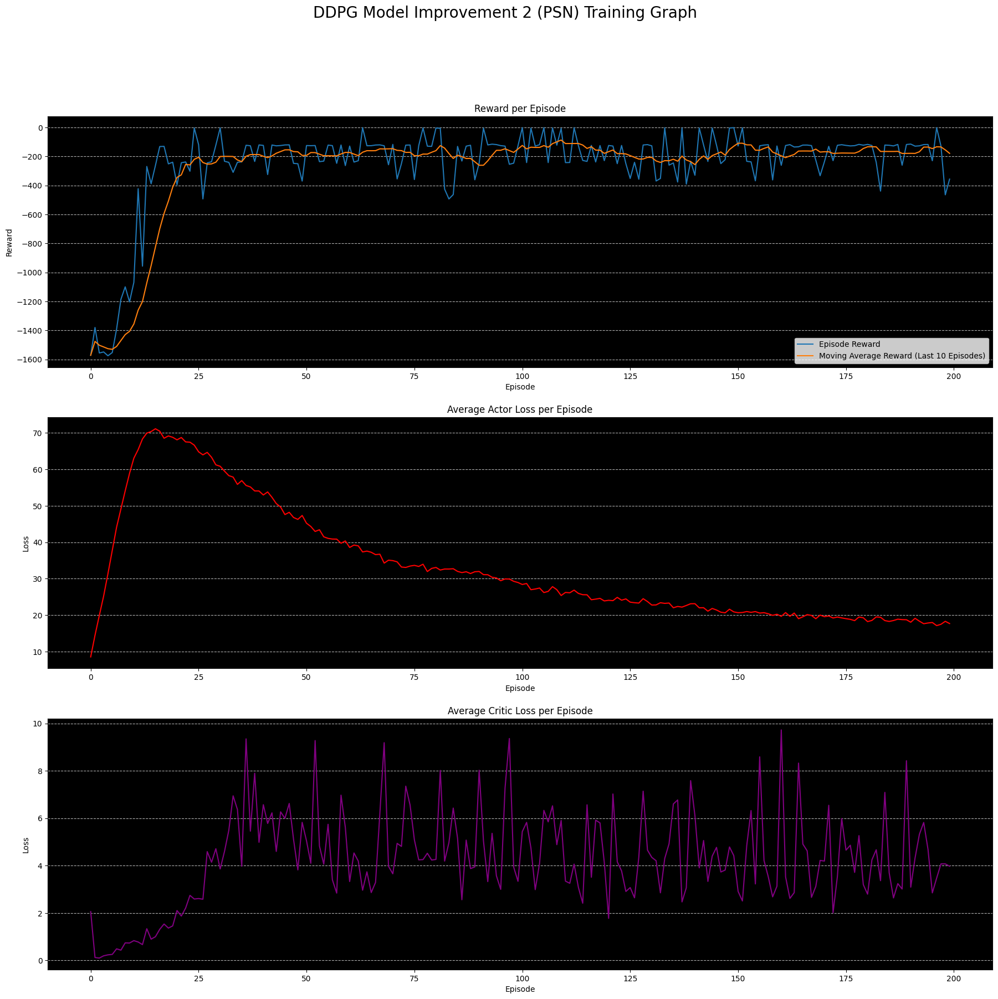

In [54]:
ddpg_2.plot_training_graphs(title='DDPG Model Improvement 2 (PSN) Training Graph')

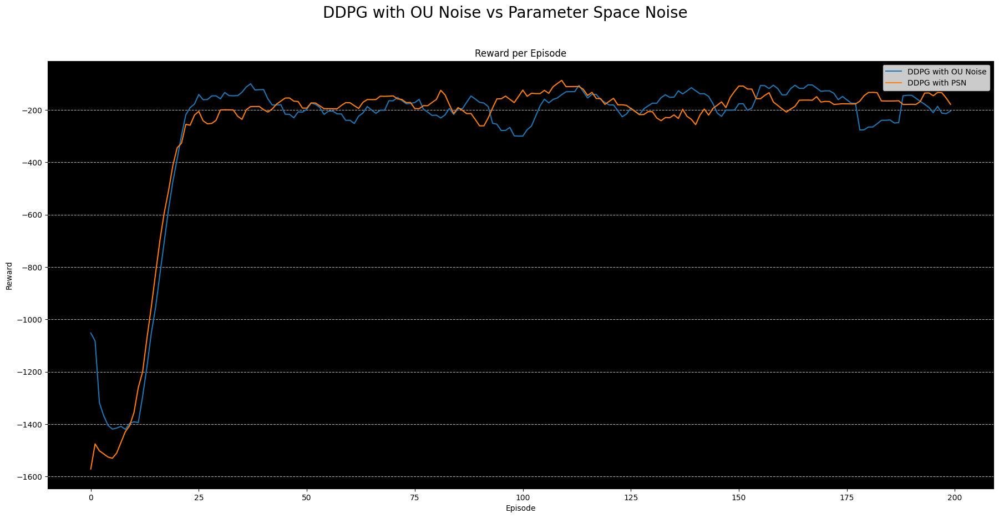

In [55]:
# ------------------------- comparing rewards from OU and PSN noise ---------------------- 

ddpg_1_ep_reward_list, ddpg_1_avg_reward_list = ddpg_1.get_reward_list()
ddpg_2_ep_reward_list, ddpg_2_avg_reward_list = ddpg_2.get_reward_list()


fig, (ax1) = plt.subplots(1, figsize=(22, 10))

fig.suptitle('DDPG with OU Noise vs Parameter Space Noise', size=20)

ax1.set_title("Reward per Episode")
ax1.plot(ddpg_1_avg_reward_list, label='DDPG with OU Noise')
ax1.plot(ddpg_2_avg_reward_list, label='DDPG with PSN')
ax1.set_xlabel("Episode")
ax1.set_ylabel("Reward")
ax1.legend()
ax1.grid(True, linestyle='--', axis='y')
ax1.set_facecolor("black")

## Improvement 3: Evaluating the effects of PSN Desired Distance Parameter on Exploration and Exploitation

#### A smaller desired_distance will result in less noise and more exploitation, as the model will be less likely to explore new actions.
#### A larger desired_distance will result in more noise and more exploration, as the model will be more likely to try new actions.

In [56]:
def build_actor_3():
    # Initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_critic_3():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)
    action_out = layers.Dense(32, activation="relu")(action_out)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model

### Desired distance of 0.1

In [58]:
ddpg_3_low_dd = DDPG_PSN_Agent(build_actor=build_actor_3, build_critic=build_critic_3, total_episodes=200, desired_distance=0.1)
ddpg_3_low_dd.train(save_gif_path='DDPG/ddpg_3_low_dd.gif')
ddpg_3_low_dd_ep_reward_list, ddpg_3_low_dd_avg_reward_list = ddpg_3_low_dd.get_reward_list()

Episode 1 | Average Reward: -1386.6341422489052 | Episode Duration: 8.07 seconds | Average Critic Loss: 0.7036105990409851 | Average Actor Loss: 8.801080703735352
Episode 2 | Average Reward: -1226.5838169858243 | Episode Duration: 7.66 seconds | Average Critic Loss: 0.1655248999595642 | Average Actor Loss: 13.554369926452637
Episode 3 | Average Reward: -1342.7114084612058 | Episode Duration: 7.42 seconds | Average Critic Loss: 0.21490667760372162 | Average Actor Loss: 17.07006072998047
Episode 4 | Average Reward: -1367.977608908067 | Episode Duration: 7.61 seconds | Average Critic Loss: 0.19045677781105042 | Average Actor Loss: 21.467500686645508
Episode 5 | Average Reward: -1404.5941220519617 | Episode Duration: 7.54 seconds | Average Critic Loss: 0.29891371726989746 | Average Actor Loss: 27.2607364654541
Episode 6 | Average Reward: -1439.192914483044 | Episode Duration: 7.56 seconds | Average Critic Loss: 0.2932144105434418 | Average Actor Loss: 33.01009750366211
Episode 7 | Average 

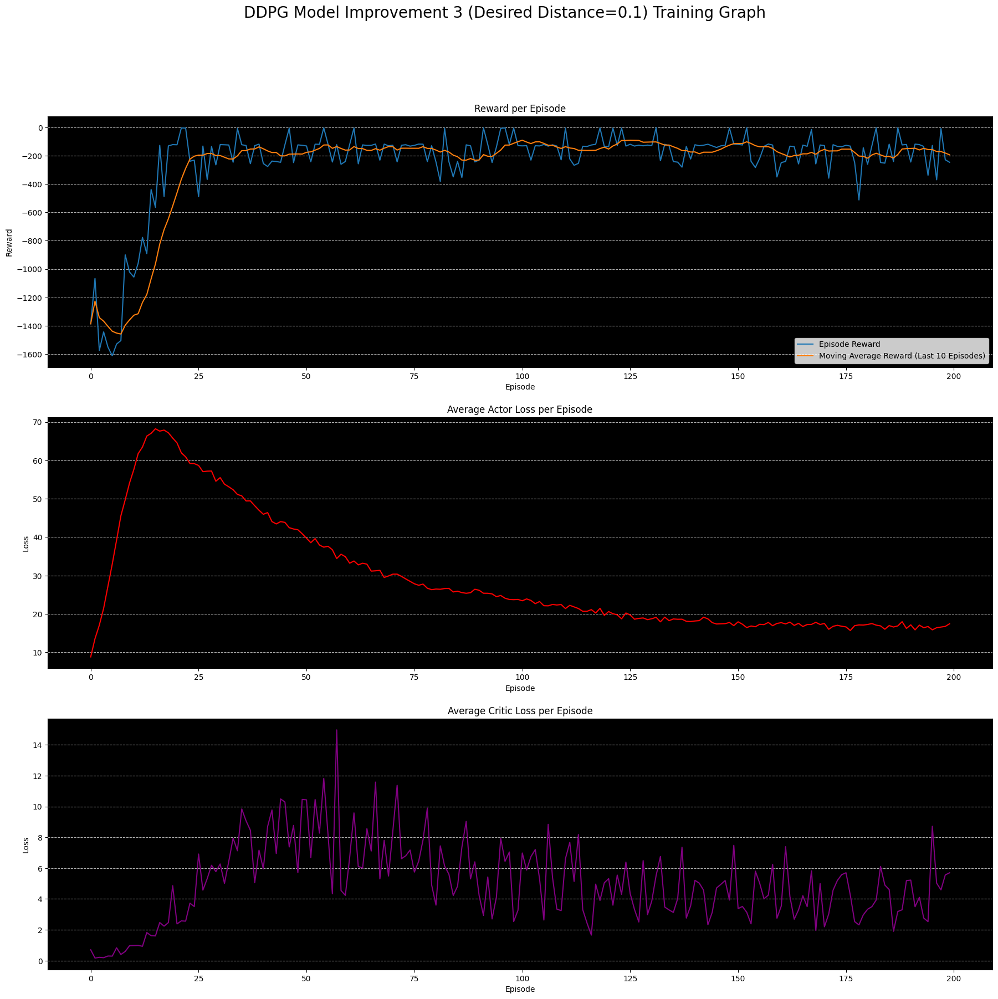

In [59]:
ddpg_3_low_dd.plot_training_graphs(title='DDPG Model Improvement 3 (Desired Distance=0.1) Training Graph')

### Desired distance of 0.5

In [60]:
ddpg_3_mid_dd = DDPG_PSN_Agent(build_actor=build_actor_3, build_critic=build_critic_3, total_episodes=200, desired_distance=0.5)
ddpg_3_mid_dd.train(save_gif_path='DDPG/ddpg_3_mid_dd.gif')
ddpg_3_mid_dd_ep_reward_list, ddpg_3_mid_dd_avg_reward_list = ddpg_3_mid_dd.get_reward_list()

Episode 1 | Average Reward: -1407.9976121430934 | Episode Duration: 7.88 seconds | Average Critic Loss: 1.1949265003204346 | Average Actor Loss: 7.530499458312988
Episode 2 | Average Reward: -1393.4462785415112 | Episode Duration: 7.61 seconds | Average Critic Loss: 0.05216715857386589 | Average Actor Loss: 12.157652854919434
Episode 3 | Average Reward: -1446.6853600029997 | Episode Duration: 7.67 seconds | Average Critic Loss: 0.0924714207649231 | Average Actor Loss: 17.623233795166016
Episode 4 | Average Reward: -1487.944508780874 | Episode Duration: 7.67 seconds | Average Critic Loss: 0.12286558002233505 | Average Actor Loss: 24.130258560180664
Episode 5 | Average Reward: -1499.2213532199983 | Episode Duration: 7.55 seconds | Average Critic Loss: 0.14192959666252136 | Average Actor Loss: 30.476682662963867
Episode 6 | Average Reward: -1477.8697245563988 | Episode Duration: 7.61 seconds | Average Critic Loss: 0.1594659388065338 | Average Actor Loss: 36.74276351928711
Episode 7 | Aver

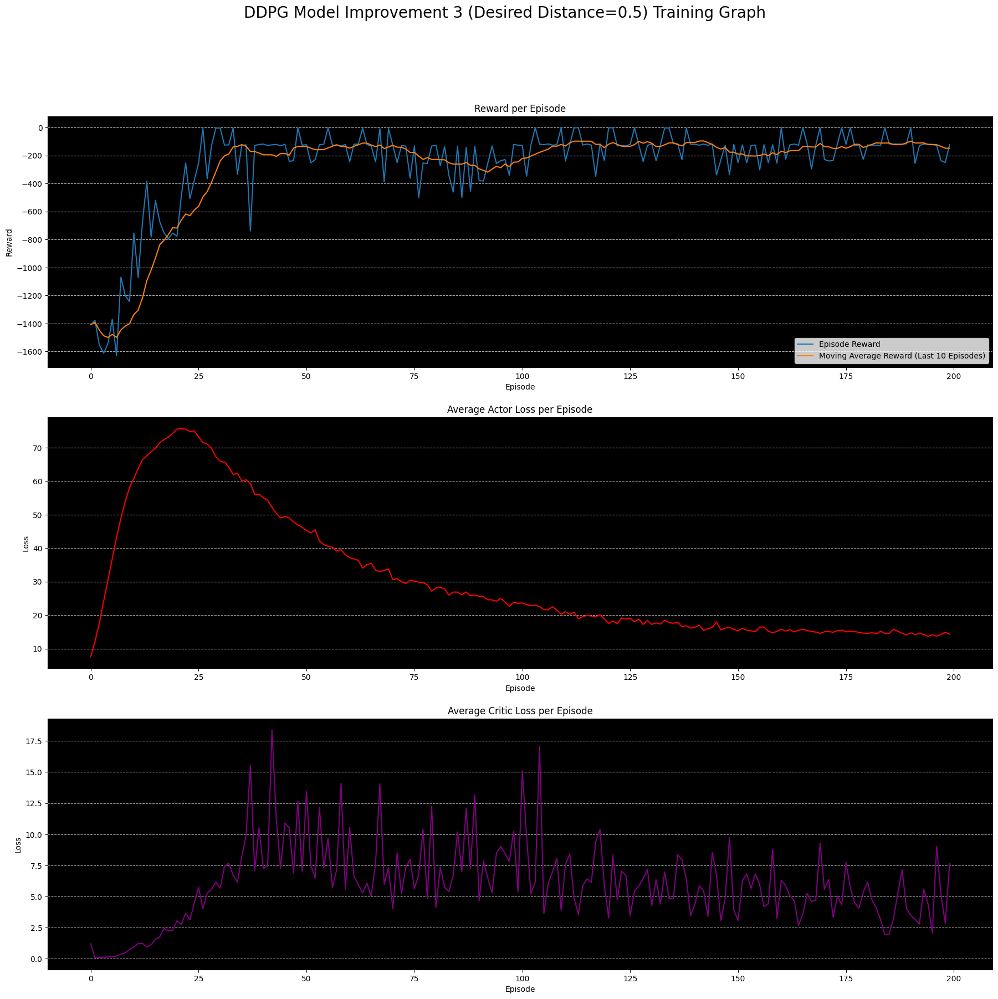

In [61]:
ddpg_3_mid_dd.plot_training_graphs(title='DDPG Model Improvement 3 (Desired Distance=0.5) Training Graph')

### Desired distance of 1.0

In [62]:
ddpg_3_high_dd = DDPG_PSN_Agent(build_actor=build_actor_3, build_critic=build_critic_3, total_episodes=200, desired_distance=1.0)
ddpg_3_high_dd.train(save_gif_path='DDPG/ddpg_3_high_dd.gif')
ddpg_3_high_dd_ep_reward_list, ddpg_3_high_dd_avg_reward_list = ddpg_3_high_dd.get_reward_list()

Episode 1 | Average Reward: -1305.8067048401506 | Episode Duration: 7.93 seconds | Average Critic Loss: 0.7302625775337219 | Average Actor Loss: 6.150612831115723
Episode 2 | Average Reward: -1454.9211149521407 | Episode Duration: 7.68 seconds | Average Critic Loss: 0.059125252068042755 | Average Actor Loss: 11.546073913574219
Episode 3 | Average Reward: -1507.7669627080174 | Episode Duration: 7.63 seconds | Average Critic Loss: 0.04232983663678169 | Average Actor Loss: 17.512901306152344
Episode 4 | Average Reward: -1558.7940199622014 | Episode Duration: 7.57 seconds | Average Critic Loss: 0.09093355387449265 | Average Actor Loss: 24.051620483398438
Episode 5 | Average Reward: -1583.5980777716882 | Episode Duration: 7.79 seconds | Average Critic Loss: 0.13074123859405518 | Average Actor Loss: 31.068532943725586
Episode 6 | Average Reward: -1583.5947941534776 | Episode Duration: 7.61 seconds | Average Critic Loss: 0.20497113466262817 | Average Actor Loss: 37.67348098754883
Episode 7 | 

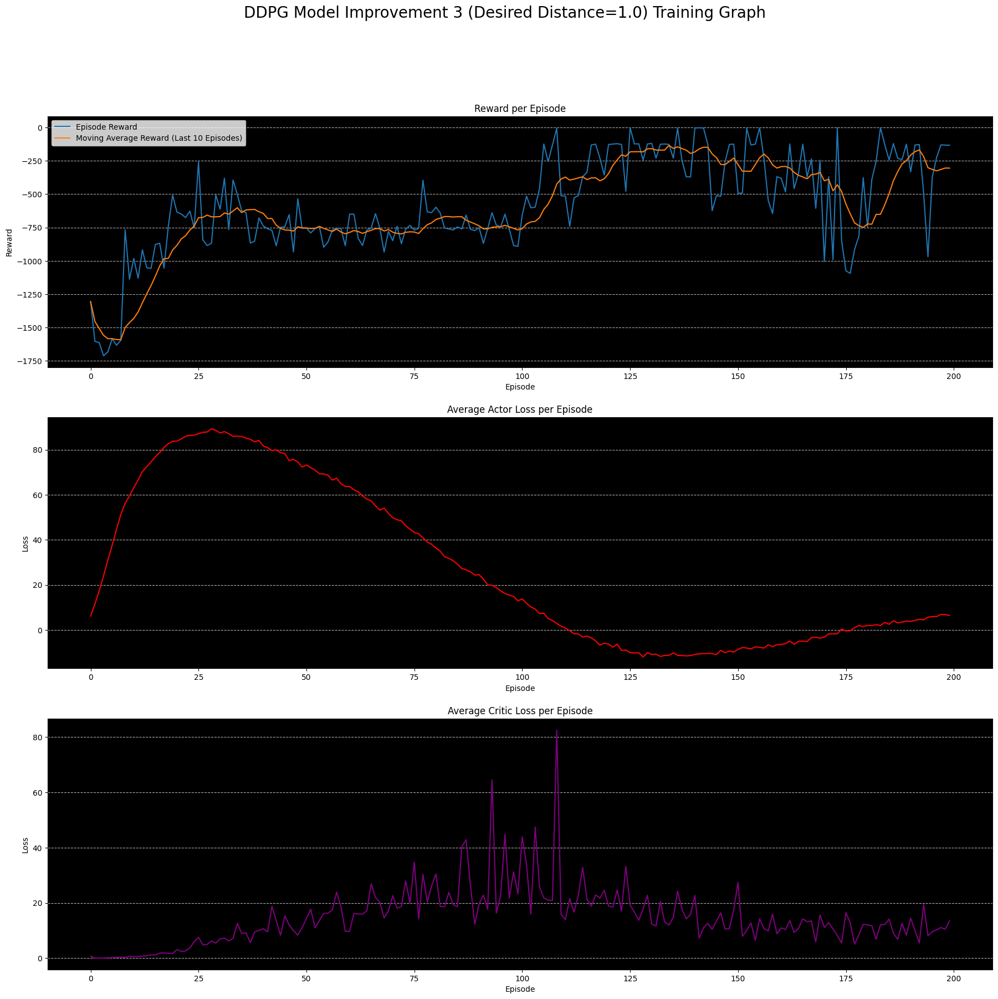

In [63]:
ddpg_3_high_dd.plot_training_graphs(title='DDPG Model Improvement 3 (Desired Distance=1.0) Training Graph')

### Evaluate the differences
#### Overall, desired distance of 0.1 showed the fastest convergence and highest reward at the end. Desired distance of 1.0 had the lowest reward at the end, and started to perform worse after about 80 epochs.
#### Therefore, will be choosing a desired distance of 0.1

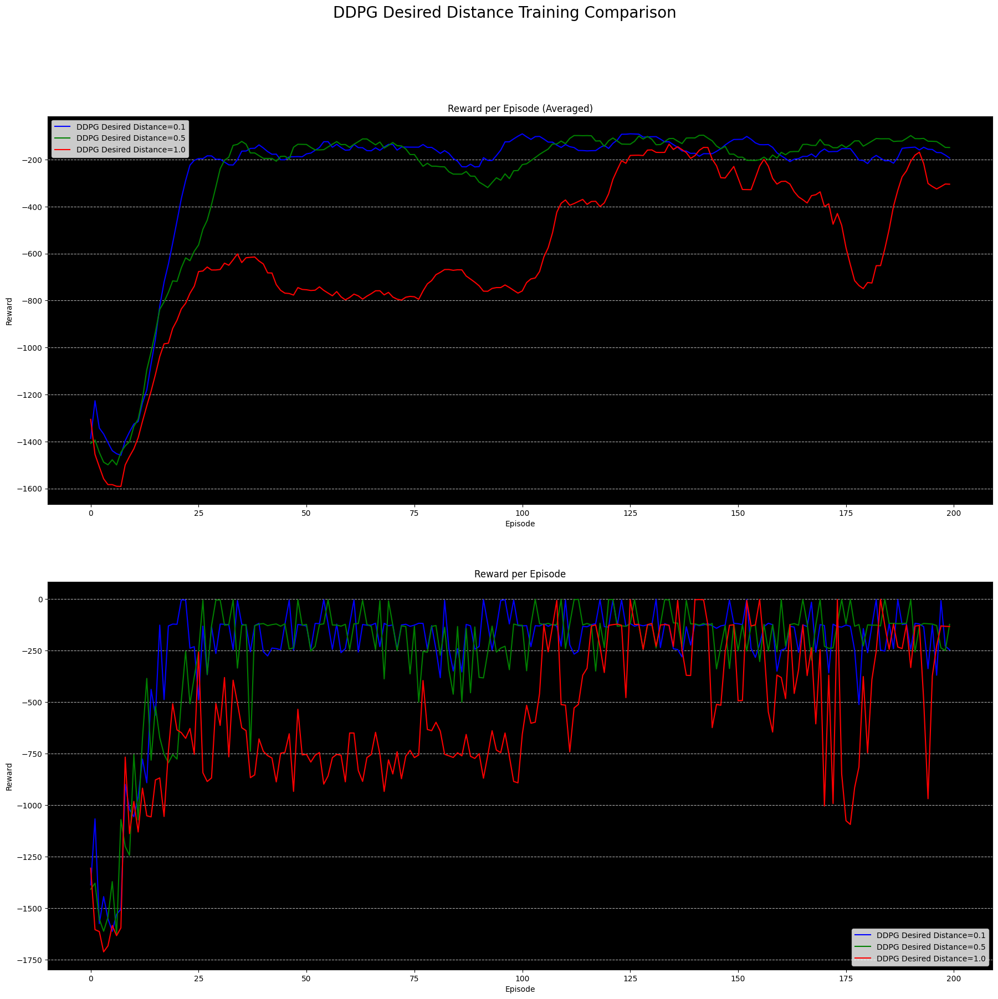

In [64]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(22, 20))

fig.suptitle('DDPG Desired Distance Training Comparison', size=20)

ax1.set_title("Reward per Episode (Averaged)")
ax1.plot(ddpg_3_low_dd_avg_reward_list, label='DDPG Desired Distance=0.1', color='blue')
ax1.plot(ddpg_3_mid_dd_avg_reward_list, label='DDPG Desired Distance=0.5', color ='green')
ax1.plot(ddpg_3_high_dd_avg_reward_list, label='DDPG Desired Distance=1.0', color ='red')
ax1.set_xlabel("Episode")
ax1.set_ylabel("Reward")
ax1.legend()
ax1.grid(True, linestyle='--', axis='y')
ax1.set_facecolor("black")


ax2.set_title("Reward per Episode")
ax2.plot(ddpg_3_low_dd_ep_reward_list, label='DDPG Desired Distance=0.1', color='blue')
ax2.plot(ddpg_3_mid_dd_ep_reward_list, label='DDPG Desired Distance=0.5', color ='green')
ax2.plot(ddpg_3_high_dd_ep_reward_list, label='DDPG Desired Distance=1.0', color ='red')
ax2.set_xlabel("Episode")
ax2.set_ylabel("Reward")
ax2.legend()
ax2.grid(True, linestyle='--', axis='y')
ax2.set_facecolor("black")

## Improvement 4: Using prioritised experience replay

### Prioritized Experience Replay (PER) enhances the learning efficiency of reinforcement learning algorithms compared to random experience replay
### PER focuses the learning process on experiences that are likely to provide more valuable learning signals. By replaying these important experiences more frequently, the agent can learn more efficiently and converge faster.
### PER can help in reducing overfitting to specific experiences by ensuring that a diverse set of important experiences are sampled.
### Reference: https://cardwing.github.io/files/RL_course_report.pdf

### Creating DDPG Class with PER
#### Referenced Code for Buffer: https://github.com/germain-hug/Deep-RL-Keras/blob/master/utils/memory_buffer.py

In [65]:
class PSNActionNoise:
    def __init__(self, initial_stddev=0.2, desired_distance=0.1, adaptation_coefficient=1.01, shape=(1,)):
        """
        Parameters:
        initial_stddev: Initial standard deviation of the noise.
        desired_distance: Target distance between noisy and original actions for adaptation.
        adaptation_coefficient: Factor to adapt the noise standard deviation.
        shape: Shape of the action space
        """
        self.stddev = initial_stddev
        self.desired_distance = desired_distance
        self.adaptation_coefficient = adaptation_coefficient
        self.shape = shape

    def __call__(self, actor, state):
        noisy_actor = self.add_noise(actor) # Create a noisy version of the actor
        original_action = actor(state)   # Get action from the original actor
        noisy_action = noisy_actor(state)   # Get action from the noisy actor

        distance = np.mean(np.square(original_action - noisy_action)) # Compute the distance between original and noisy actions
        
         # Adapt noise standard deviation based on the distance
        if distance > self.desired_distance:
            self.stddev /= self.adaptation_coefficient
        else:
            self.stddev *= self.adaptation_coefficient

        return noisy_action.numpy().flatten()  # Return noisy action

    def add_noise(self, actor):
        noisy_actor = tf.keras.models.clone_model(actor) # Clone the actor model
        # Add Gaussian noise to each weight of the cloned model
        noisy_actor.set_weights([w + np.random.normal(0, self.stddev, size=w.shape) for w in actor.get_weights()])
        return noisy_actor

In [66]:
class PrioritizedBuffer:
    def __init__(self, buffer_capacity=100000, batch_size=64, num_states=3, num_actions=1, alpha=0.7, beta_start=0.4, beta_frames=5000):
        self.num_states = num_states  # Number of state variables in the environment
        self.num_actions = num_actions  # Number of actions the agent can take
        
        self.buffer_capacity = buffer_capacity  # Maximum size of the buffer
        self.batch_size = batch_size  # Size of the batch sampled from the buffer
        self.alpha = alpha  # Determines how much prioritization is used (0 - no prioritization, 1 - full prioritization)
        self.beta_start = beta_start  # Initial value of beta (importance-sampling weight)
        self.beta_frames = beta_frames  # Number of frames over which beta will be annealed to 1.0
        self.beta = beta_start  # Current value of beta, starts at beta_start
        self.buffer_counter = 0  # Counter to keep track of the number of elements in the buffer
        
        # Buffer storage
        self.state_buffer = np.zeros((self.buffer_capacity, self.num_states))  # Buffer to store states
        self.action_buffer = np.zeros((self.buffer_capacity, self.num_actions))  # Buffer to store actions
        self.reward_buffer = np.zeros((self.buffer_capacity, 1))  # Buffer to store rewards
        self.next_state_buffer = np.zeros((self.buffer_capacity, self.num_states))  # Buffer to store next states
        self.priorities = np.zeros((self.buffer_capacity,))  # Priorities for PER

    def record(self, obs_tuple, priority=1.0):
        index = self.buffer_counter % self.buffer_capacity
        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]
        self.priorities[index] = priority  # Set priority for new experience
        self.buffer_counter += 1

    def update_priorities(self, indices, priorities):
        self.priorities[indices] = priorities

    def sample(self):
        # Calculate sampling probabilities
        scaled_priorities = self.priorities ** self.alpha
        probs = scaled_priorities / np.sum(scaled_priorities)
        indices = np.random.choice(len(probs), size=self.batch_size, p=probs)

        # Calculate importance-sampling weights
        probs = probs[indices]
        weights = (len(self.priorities) * probs) ** (-self.beta)
        weights /= weights.max()
        
        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[indices])
        reward_batch = tf.cast(tf.convert_to_tensor(self.reward_buffer[indices]), dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[indices])
        weights = tf.convert_to_tensor(weights, dtype=tf.float32)
        
        return state_batch, action_batch, reward_batch, next_state_batch, weights, indices

    @tf.function
    def update(self, state_batch, action_batch, reward_batch, next_state_batch, weights, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        # Calculate critic loss and update critic
        with tf.GradientTape() as tape:
            target_actions = target_actor(next_state_batch, training=True)
            y = reward_batch + gamma * target_critic([next_state_batch, target_actions], training=True)
            critic_value = critic_model([state_batch, action_batch], training=True)
            critic_loss = tf.math.reduce_mean(weights * tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, critic_model.trainable_variables)
        critic_optimizer.apply_gradients(zip(critic_grad, critic_model.trainable_variables))

        # Calculate actor loss and update actor
        with tf.GradientTape() as tape:
            actions = actor_model(state_batch, training=True)
            critic_value = critic_model([state_batch, actions], training=True)
            actor_loss = -tf.math.reduce_mean(critic_value)  # Negative since we want to maximize the critic value

        actor_grad = tape.gradient(actor_loss, actor_model.trainable_variables)
        actor_optimizer.apply_gradients(zip(actor_grad, actor_model.trainable_variables))
        
        return critic_loss, actor_loss

    def learn(self, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer):
        state_batch, action_batch, reward_batch, next_state_batch, weights, indices = self.sample()
        
        critic_loss, actor_loss = self.update(state_batch, action_batch, reward_batch, next_state_batch, weights, target_actor, actor_model, target_critic, critic_model, gamma, actor_optimizer, critic_optimizer)
        
        # Update priorities
        td_errors = reward_batch + gamma * target_critic([next_state_batch, target_actor(next_state_batch, training=True)], training=True) - critic_model([state_batch, action_batch], training=True)
        updated_priorities = np.abs(td_errors.numpy()).flatten() + 1e-6
        self.update_priorities(indices, updated_priorities)
        
        # Update beta
        self.beta = min(1.0, self.beta_start + (1.0 - self.beta_start) * self.buffer_counter / self.beta_frames)
        
        return critic_loss, actor_loss

In [90]:
class DDPG_PSN_PER_Agent:
    def __init__(self, build_actor, build_critic, buffer_class=PrioritizedBuffer, psn_action_noise_class=PSNActionNoise, buffer_capacity=100000, batch_size=64, gamma=0.99, tau=0.005, critic_lr=0.002, actor_lr=0.001, total_episodes=100, noise_std_dev=0.2, desired_distance=0.1):
        self.env = gym.make('Pendulum-v1', g=9.81, render_mode="rgb_array")

        # get action and state space
        self.num_states = self.env.observation_space.shape[0]    # 3 states
        self.num_actions = self.env.action_space.shape[0]    # 1 action
        self.upper_bound = self.env.action_space.high[0] # 2.0
        self.lower_bound = self.env.action_space.low[0] # -2.0

        self.buffer = buffer_class(buffer_capacity, batch_size, self.num_states, self.num_actions)
        self.total_episodes = total_episodes
        self.gamma = gamma
        self.tau = tau
        self.actor_lr = actor_lr
        self.critic_lr = critic_lr

        # initialize models
        self.actor_model = build_actor()
        self.critic_model = build_critic()
        self.target_actor = build_actor()
        self.target_critic = build_critic()

        # make the weights equal initially
        self.target_actor.set_weights(self.actor_model.get_weights())
        self.target_critic.set_weights(self.critic_model.get_weights())

        # optimizers
        self.actor_optimizer = tf.keras.optimizers.Adam(actor_lr)
        self.critic_optimizer = tf.keras.optimizers.Adam(critic_lr)

        # noise
        self.noise_std_dev = noise_std_dev
        self.psn_noise = psn_action_noise_class(initial_stddev=noise_std_dev, desired_distance=desired_distance, shape=(self.num_actions,))

        # episode history
        self.ep_reward_list = [] # to store reward history of each episode
        self.avg_reward_list = []  # to store average reward history of last few episodes

        self.avg_ep_critic_loss_list = []  # to store average critic losses during training 
        self.avg_ep_actor_loss_list = []  # to store average actor losses during training

    def policy(self, state):
        sampled_actions = tf.squeeze(self.actor_model(state))
        noise = self.psn_noise(self.actor_model, state)
        legal_action = np.clip(sampled_actions.numpy() + noise, self.lower_bound, self.upper_bound) # add noise to action and clipping to ensure that action is within the bounds
        return [np.squeeze(legal_action)]

    @tf.function # tensorflow function decorator builds static graph out of the update function to speed up the function
    def update_target(self, target_weights, weights, tau):    # update the target parameters slowly, based on the value of tau
        for (a, b) in zip(target_weights, weights):
            a.assign(b * tau + a * (1 - tau))

    def train(self, save_gif_path='ddpg_pendulum_training.gif'):
        for ep in range(self.total_episodes):
            prev_state, _ = self.env.reset()
            prev_state = np.array(prev_state)
            episodic_reward = 0
            frames = [] # list to store each frame (time step) to save it into a gif
            critic_losses = []
            actor_losses = []

            episode_start_time = time.time()
            while True:
                tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)
                action = self.policy(tf_prev_state)

                # receive state and reward from environment
                state, reward, terminated, truncated, _ = self.env.step(action) # terminated = True, when the pendulum pole is upright. Trucated = True, when the episode reaches a time step of 200
                done = terminated or truncated

                # Record experience with initial priority
                self.buffer.record((prev_state, action, reward, state), priority=1.0)
                episodic_reward += reward

                critic_loss, actor_loss = self.buffer.learn(self.target_actor, self.actor_model, self.target_critic, self.critic_model, self.gamma, self.actor_optimizer, self.critic_optimizer)
                critic_losses.append(critic_loss)
                actor_losses.append(actor_loss)

                # update target networks
                self.update_target(self.target_actor.variables, self.actor_model.variables, self.tau)
                self.update_target(self.target_critic.variables, self.critic_model.variables, self.tau)

                frames.append(self.env.render())

                # end episode (i.e. break the loop) when `done` is True
                if done:
                    break

                prev_state = state

            episode_duration = time.time() - episode_start_time # get the duration of an episode

            avg_critic_loss = np.mean(critic_losses)
            avg_actor_loss = np.mean(actor_losses)

            self.avg_ep_critic_loss_list.append(avg_critic_loss)
            self.avg_ep_actor_loss_list.append(avg_actor_loss)

            self.ep_reward_list.append(episodic_reward)
            # mean of last 40 episodes
            avg_reward = np.mean(self.ep_reward_list[-10:])
            print(f"Episode {ep+1} | Average Reward: {avg_reward} | Episode Duration: {episode_duration:.2f} seconds | Average Critic Loss: {avg_critic_loss} | Average Actor Loss: {avg_actor_loss}")
            self.avg_reward_list.append(avg_reward)

        imageio.mimsave(save_gif_path, frames, fps=30, loop=0)   # save the frames for the last model 


    def plot_training_graphs(self, title='DDPG Base Model Training Graph'):
        fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(22, 20))

        fig.suptitle(title, size=20)

        ax1.set_title("Reward per Episode")
        ax1.plot(self.ep_reward_list, label='Episode Reward')
        ax1.plot(self.avg_reward_list, label='Moving Average Reward (Last 10 Episodes)')
        ax1.set_xlabel("Episode")
        ax1.set_ylabel("Reward")
        ax1.legend()
        ax1.grid(True, linestyle='--', axis='y')
        ax1.set_facecolor("black")

        ax2.set_title("Average Actor Loss per Episode")
        ax2.plot(self.avg_ep_actor_loss_list, color='red')
        ax2.set_xlabel("Episode")
        ax2.set_ylabel("Loss")
        ax2.grid(True, linestyle='--', axis='y')
        ax2.set_facecolor("black")

        ax3.set_title("Average Critic Loss per Episode",)
        ax3.plot(self.avg_ep_critic_loss_list, color='purple')
        ax3.set_xlabel("Episode")
        ax3.set_ylabel("Loss")
        ax3.grid(True, linestyle='--', axis='y')
        ax3.set_facecolor("black")

        plt.show()

    def get_reward_list(self):
        return self.ep_reward_list, self.avg_reward_list
        
    def get_loss_list(self):
        return self.avg_ep_critic_loss_list, self.avg_ep_actor_loss_list

    def save_weights(self, actor_path="actor.h5", critic_path="critic.h5", target_actor_path="target_actor.h5", target_critic_path="target_critic.h5"):
        self.actor_model.save_weights(actor_path)
        self.critic_model.save_weights(critic_path)
        self.target_actor.save_weights(target_actor_path)
        self.target_critic.save_weights(target_critic_path)
        print(f"Weights saved successfully.")

    def load_weights(self, actor_path="actor.h5", critic_path="critic.h5", target_actor_path="target_actor.h5", target_critic_path="target_critic.h5"):
        self.actor_model.load_weights(actor_path)
        self.critic_model.load_weights(critic_path)
        self.target_actor.load_weights(target_actor_path)
        self.target_critic.load_weights(target_critic_path)
        print(f"Weights loaded successfully.")

    def evaluate(self, num_episodes=10, render=False, save_gif_path='Final_DDPG.gif'):
        env = gym.make('Pendulum-v1', render_mode='rgb_array')
        env.action_space.seed(42)
        total_rewards = []
        frames = []

        for _ in range(num_episodes):
            state, _ = self.env.reset()
            state = np.array(state)
            episode_reward = 0
            done = False
            
            while not done:
                tf_state = tf.expand_dims(tf.convert_to_tensor(state), 0)
                action = self.policy(tf_state)
                
                state, reward, terminated, truncated, _ = self.env.step(action)
                done = terminated or truncated
                
                episode_reward += reward
                
                if render:
                    frame = self.env.render()
                    frames.append(frame)
                    
            total_rewards.append(episode_reward)
            
        average_reward = np.mean(total_rewards)
        std_reward = np.std(total_rewards)
        print(f"Average Reward over {num_episodes} episodes: {average_reward}")
        print(f"Standard Deviation over {num_episodes} episodes: {std_reward}")

        if render:
            imageio.mimsave(save_gif_path, frames, fps=50, loop=0)
            print(f"Evaluation GIF saved to {save_gif_path}")
            self.env.close()

        return average_reward


### Train

In [68]:
def build_actor_4():
    # Initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_critic_4():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)
    action_out = layers.Dense(32, activation="relu")(action_out)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model

In [79]:
ddpg_4 = DDPG_PSN_PER_Agent(build_actor=build_actor_4, build_critic=build_critic_4, total_episodes=200, desired_distance=0.1)
ddpg_4.train(save_gif_path='DDPG/ddpg_4.gif')

Episode 1 | Average Reward: -1666.6725207783309 | Episode Duration: 9.28 seconds | Average Critic Loss: 2.926802158355713 | Average Actor Loss: 9.66454029083252
Episode 2 | Average Reward: -1610.4672075541816 | Episode Duration: 8.80 seconds | Average Critic Loss: 0.03554610535502434 | Average Actor Loss: 15.167716979980469
Episode 3 | Average Reward: -1517.679007161337 | Episode Duration: 8.55 seconds | Average Critic Loss: 0.045874129980802536 | Average Actor Loss: 21.195228576660156
Episode 4 | Average Reward: -1502.661803922918 | Episode Duration: 8.77 seconds | Average Critic Loss: 0.05532289668917656 | Average Actor Loss: 27.3580379486084
Episode 5 | Average Reward: -1452.0895580349165 | Episode Duration: 8.89 seconds | Average Critic Loss: 0.17681297659873962 | Average Actor Loss: 32.776206970214844
Episode 6 | Average Reward: -1460.9380655041298 | Episode Duration: 8.79 seconds | Average Critic Loss: 0.10737106204032898 | Average Actor Loss: 39.531375885009766
Episode 7 | Avera

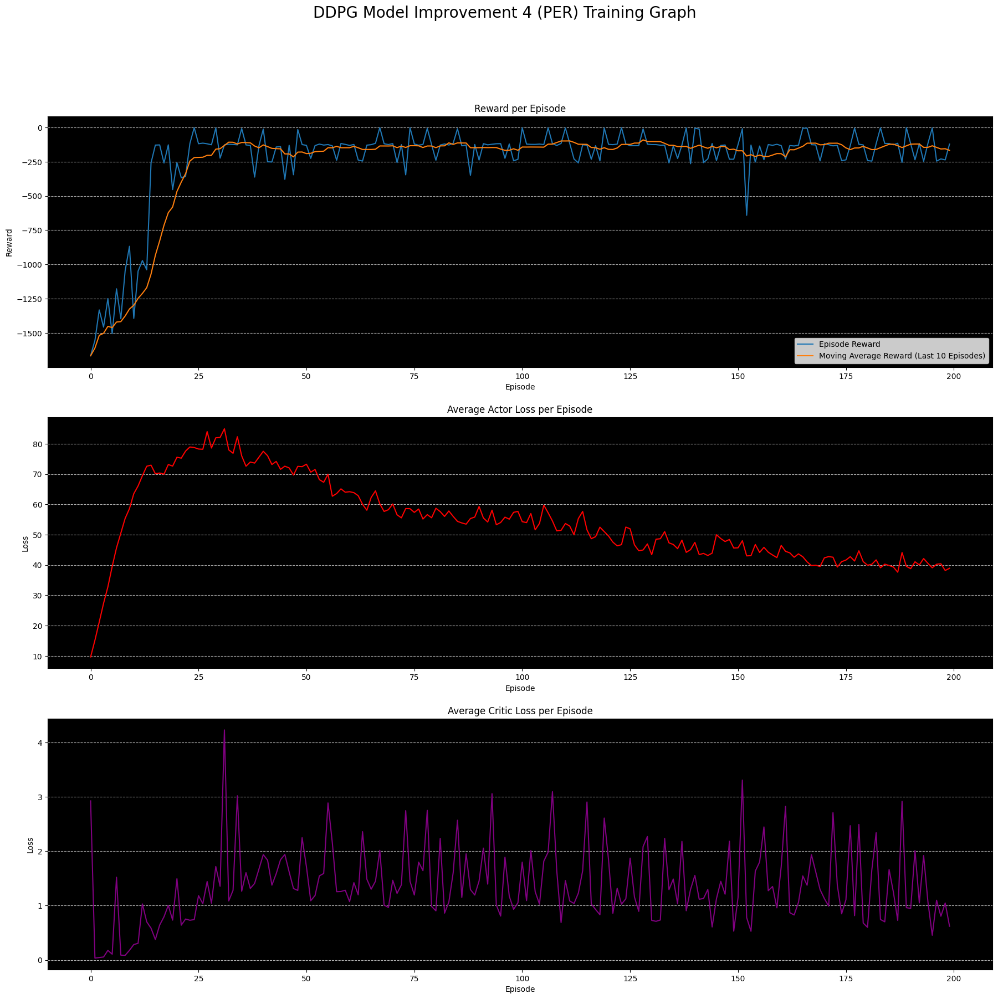

In [80]:
ddpg_4.plot_training_graphs(title='DDPG Model Improvement 4 (PER) Training Graph')

## Improvement 5: Choosing the best remaining parameters

### Effects of parameters
#### Gamma: the discount factor, it determines how much future rewards are worth compared to immediate rewards. Closer to 0, the agent will prioritize immediate rewards more heavily and will be more shortsighted. Closer to 1, the agent will consider future rewards more significantly, making it more farsighted.
#### Tau: the soft update factor for updating the target networks. A small tau results in very slow updates, which makes the target networks more stable but less responsive to changes. A larger tau results in faster updates, which makes the target networks more responsive but can lead to instability.

In [75]:
def build_actor_5():
    # Initialize weights between -3e-3 and 3-e3, this is to prevent from getting -1 or 1 output values, which would lead the gradients to be 0.
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(3,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    outputs = outputs * 2.0 # since the action space is -2.0 to 2.0 we want to convert [-1, 1] from tanh to [-2, 2]
    model = tf.keras.Model(inputs, outputs)
    return model


def build_critic_5():
    # handle state input
    state_input = layers.Input(shape=(3))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # handle action input
    action_input = layers.Input(shape=(1))
    action_out = layers.Dense(16, activation="relu")(action_input)
    action_out = layers.Dense(32, activation="relu")(action_out)

    # concat action and state into one layer
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # output estimated q value
    model = tf.keras.Model([state_input, action_input], outputs)

    return model


In [82]:
ddpg_5 = DDPG_PSN_PER_Agent(build_actor=build_actor_5, build_critic=build_critic_5, buffer_capacity=100000, batch_size=256, gamma=0.999, tau=0.004, critic_lr=0.001, actor_lr=0.002, total_episodes=200, noise_std_dev=0.2, desired_distance=0.1)
ddpg_5.train(save_gif_path='DDPG/ddpg_5.gif')

# Save the weights of the trained models
ddpg_5.save_weights(actor_path="DDPG_actor.h5", critic_path="DDPG_critic.h5", target_actor_path="DDPG_target_actor.h5", target_critic_path="DDPG_target_critic.h5")

Episode 1 | Average Reward: -1159.9850164071447 | Episode Duration: 9.56 seconds | Average Critic Loss: 2.4549975395202637 | Average Actor Loss: 6.386954307556152
Episode 2 | Average Reward: -1335.354079089118 | Episode Duration: 9.03 seconds | Average Critic Loss: 0.1012343317270279 | Average Actor Loss: 11.145830154418945
Episode 3 | Average Reward: -1400.5526773174736 | Episode Duration: 8.67 seconds | Average Critic Loss: 0.03439795598387718 | Average Actor Loss: 14.286574363708496
Episode 4 | Average Reward: -1408.8326590900865 | Episode Duration: 8.97 seconds | Average Critic Loss: 0.029759414494037628 | Average Actor Loss: 17.9766788482666
Episode 5 | Average Reward: -1420.7963477529124 | Episode Duration: 9.01 seconds | Average Critic Loss: 0.0411197766661644 | Average Actor Loss: 22.58730697631836
Episode 6 | Average Reward: -1405.3298527459974 | Episode Duration: 8.93 seconds | Average Critic Loss: 0.03178894519805908 | Average Actor Loss: 26.885286331176758
Episode 7 | Avera

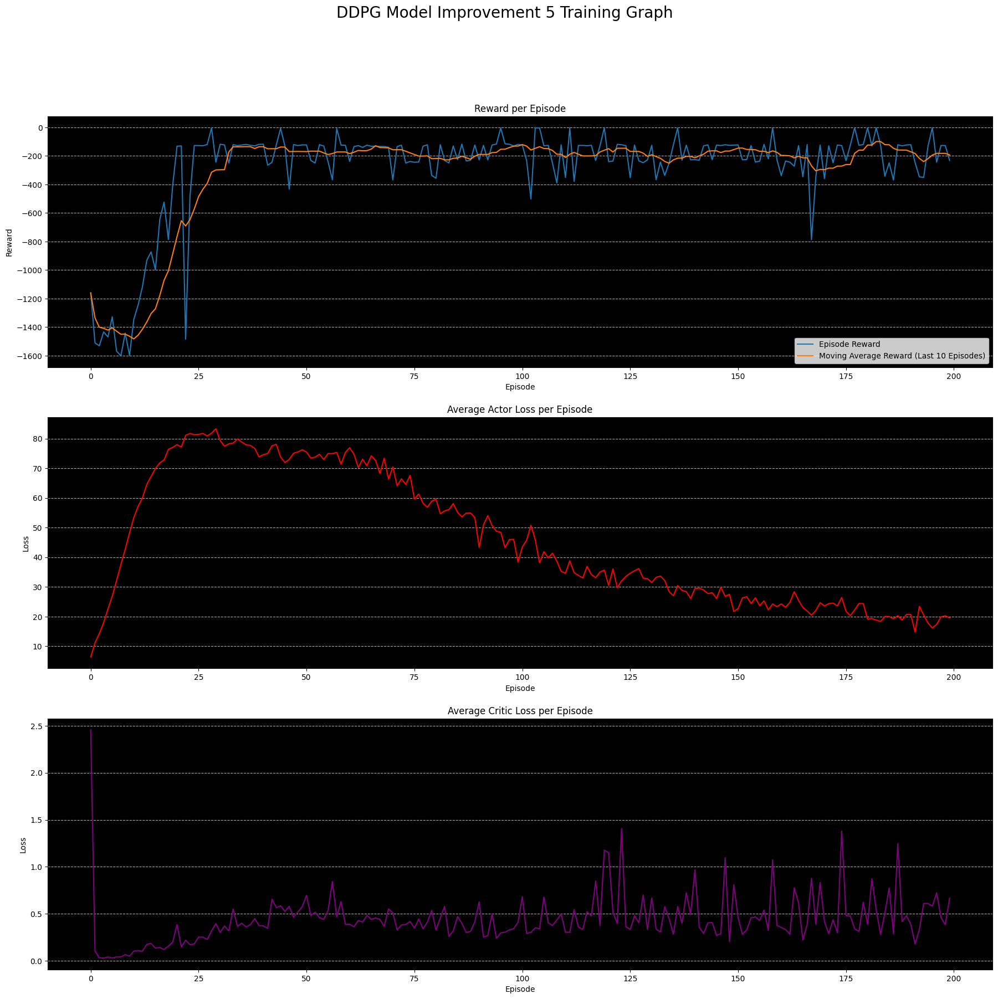

In [83]:
ddpg_5.plot_training_graphs(title='DDPG Model Improvement 5 Training Graph')

## DDPG Evaluation

In [91]:
DDPG_final = DDPG_PSN_PER_Agent(build_actor=build_actor_5, build_critic=build_critic_5, buffer_capacity=100000, batch_size=256, gamma=0.999, tau=0.004, critic_lr=0.001, actor_lr=0.002, total_episodes=200, noise_std_dev=0.2, desired_distance=0.1)
DDPG_final.load_weights("DDPG_actor.h5", "DDPG_critic.h5", "DDPG_target_actor.h5", "DDPG_target_critic.h5")
DDPG_final.evaluate(num_episodes=10, render=True)

Weights loaded successfully.
Average Reward over 10 episodes: -217.04536169334997
Standard Deviation over 10 episodes: 89.49949426120824
Evaluation GIF saved to Final_DDPG.gif


-217.04536169334997

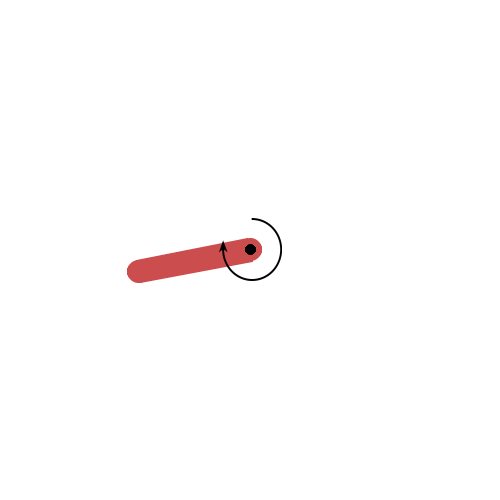